<a id='table_of_contents'></a>[Функции и глобальные переменные](#all_funcs)
* [Метрики, качество и прочее](#metrics_func)
* [Данные: чтение, перезагрузка, сохранение](#data_func)
* [Для исследования](#research_func)
* [Для визуализации](#visualize_func)
* [Для гиперпараметров](#hyper_funcs)

[0. Минимальное начало работы с данными](#start_all)<br>
* [Pandas profiling](#profiling)<br>
* [Nan's, нули и подобное](#datanulls)
* [Типы колонок](#column_types)
* [Сбалансированность классов](#target_balance)

[I. Первые наивные модели](#naive_models)<br>
* [Первичная обработка](#primitive_preprocessing)
* [Первые модели](#first_models)
* [Графики показателей](#graph12)


[II. Исследование. Часть 1. Числовые признаки](#numerical_2)<br>
* [Изучение параметров](#num_research)
* [Графики показателей](#graph1234)


[III. Построим наивные модели ещё раз теперь](#naive_3)<br>
[IV. Исследование. Часть 2. Дата](#date_4)<br>
[V. Исследование. Часть 3. Категориальные и бинарные признаки](#cat_feat_V)
* [Корелляции](#cat_correleation)
* [Car и car_type](#car_pca)
* [Home_address и work_address](#addr_pca)
* [Sna и first_time](#sna_ft_pca)

[VI. Подбор гиперпараметров](#hyperparams)<br>

[Выводы, результаты](#concs)

In [5]:
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, balanced_accuracy_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.feature_selection import f_classif, mutual_info_classif

import seaborn as sns
from pandas import Series
import pandas as pd
import numpy as np

from datetime import *

import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
import warnings
# warnings.filterwarnings('ignore')
warnings.filterwarnings(action='once')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

In [7]:
# печатать не бесконечные флоаты
np.set_printoptions(precision=5, suppress=True)
pd.set_option("display.precision", 6)

In [8]:
# # печатать побольше
# np.set_printoptions(precision=10, suppress=True)
# pd.set_option("display.precision", 10)

### Раскомментируйте следующее чтобы установить pandas profiling

In [9]:
#import sys
#!{sys.executable} -m pip install -U pandas-profiling[notebook]

In [10]:
from pandas_profiling import ProfileReport

### <a id='all_funcs'> Функции и глобальные переменные </a>

In [11]:
# типы скейлеров, которые будем пробовать
scalers_global = ['robust', 'minmax', 'standart']
# параметры взвешенности классов, которые будем проверять
balanced_types_global = ['weighted', 'imbalanced']

In [12]:
# для возможности небольшой отладки
debug_global = False

In [13]:
RANDOM_SEED = 42

#### <a id='metrics_func'> Метрики, качество и прочее </a>

In [14]:
# словарь моделей
models_dict = {}

In [15]:
# как покажет дальнейшее порой надо будет удалять часть моделей, чтобы не мешали смотреть на общую картину
# На вход: ключевая подстрока по которой удалять
def del_by_key_subst(key_subst):
    global models_dict
    #print(models_dict.keys())
    lst_k = list(models_dict.keys())
    for vk in lst_k:
        if (vk.find(key_subst) != -1):
            models_dict.pop(vk, None)

In [16]:
def print_logisitc_metrics_line(y_true, y_pred, type_string):
    pos_label_var = 1
    prec = precision_score(y_true, y_pred, pos_label=pos_label_var)
    recl = recall_score(y_true, y_pred, pos_label=pos_label_var)

    acc = accuracy_score(y_true, y_pred)
    bal_acc = balanced_accuracy_score(y_true, y_pred)

    f1 = f1_score(y_true, y_pred, pos_label=pos_label_var)
    print(type_string)
    print(f'acc = {acc:.4f} bal acc = {bal_acc:.4f} F1-score = {f1:.4f} precision = {prec:.4f} recall = {recl:.4f}')
    return [acc, bal_acc, f1, prec, recl]

In [17]:
# Финальная подготовка данных для модели:
# нормализация цифровых признаков, one-hot-encoding категориальных, добавление бинарных
# На вход: датафрейм, списки численных, категориальных и бинарных признаков, тип скейлера
def get_prepared_model_data(df_in, num_cols_in, cat_all_in, bin_cols_in, scaler_type):
    global debug_global
    cols_index = []
    # print(scaler_type)
    if (scaler_type == 'standart'):
        # print('standart')
        X_num = StandardScaler().fit_transform(df_in[num_cols_in].values)
    elif (scaler_type == 'minmax'):
        # print('minmax')
        X_num = MinMaxScaler().fit_transform(df_in[num_cols_in].values)
    elif (scaler_type == 'robust'):
        # print('minmax')
        X_num = RobustScaler().fit_transform(df_in[num_cols_in].values)
    elif (scaler_type == 'xgd'):
        X_num = df_in[num_cols_in].values
    else:
        raise "Scaler type not implemented:" + scaler_type

    if (debug_global == True):
        print('X_num.shape=', X_num.shape)

    if (len(bin_cols_in) > 0):
        if (len(cat_all_in) > 0):
            X_cat = OneHotEncoder(categories='auto', sparse=False).fit_transform(
                df_in[cat_all_in].values)
            if (debug_global == True):
                print('cat_all_in=', cat_all_in, 'bin_cols_in=', bin_cols_in)
                print('X_cat.shape=', X_cat.shape,
                      'X_bin.shape=', len(bin_cols_in))
            cols_index = num_cols_in + cat_all_in + bin_cols_in
            X = np.hstack([X_num, X_cat, df_in[bin_cols_in].values])
        else:
            if (debug_global == True):
                print('bin_cols_in=', bin_cols_in)
                print('X_bin.shape=', len(bin_cols_in))
            cols_index = num_cols_in + bin_cols_in
            X = np.hstack([X_num, df_in[bin_cols_in].values])
    else:
        if (len(cat_all_in) > 0):
            X_cat = OneHotEncoder(categories='auto', sparse=False).fit_transform(
                df_in[cat_all_in].values)
            if (debug_global == True):
                print('cat_all_in=', cat_all_in)
                print('X_cat.shape=', X_cat.shape)
            cols_index = num_cols_in + cat_all_in
            X = np.hstack([X_num, X_cat])
        else:
            cols_index = num_cols_in
            X = np.hstack([X_num])
    if (debug_global == True):
        print('X_ready.shape=', X.shape, 'cols_index=', cols_index)
    return X, cols_index

In [18]:
# Вычисление предсказания модели, на вход переменная модели, от чего предсказывать (тест) и тип скейлера
def model_predict(model_in, X_test_in, scaler_type):
    if (debug_global == True):
        print('X_test_in=', X_test_in.shape)
    y_pred = model_in.predict(X_test_in)
    if (scaler_type != 'xgd'):
        y_pred_proba = model_in.predict_proba(X_test_in)
    else:
        y_pred_proba = model_in.decision_function(X_test_in)
    return [y_pred, y_pred_proba]

In [19]:
# Печать результатов - матрицы ошибок (в % и числах), AUC ROC и PR ROC и их сравнение с трейном.
# На вход: модель, от чего предсказывать (тест), подпись заголовка, результат предсказания для трейна и трейн.
def model_result_short(model_res, y_test_in, string_type, model_xtrain_result, y_train_in):
    y_pred = model_res[0]
    y_pred_proba = model_res[1]

    cm = confusion_matrix(y_test_in, y_pred, labels=[1, 0])
    #print(cm, '\n\n',cm/y_test_in.shape[0])

    metrics_res = print_logisitc_metrics_line(y_test_in, y_pred, "Test")

    if (string_type.find('xgd') == -1):
        fpr, tpr, thresholds = roc_curve(y_test_in, y_pred_proba[:, 1])
        roc_auc = roc_auc_score(y_test_in, y_pred_proba[:, 1])
        prec_r, rec_r, pr_thr = precision_recall_curve(
            y_test_in, y_pred_proba[:, 1])
        auc_pr = auc(rec_r, prec_r)
    else:
        fpr, tpr, thresholds = roc_curve(y_test_in, y_pred_proba)
        roc_auc = roc_auc_score(y_test_in, y_pred_proba)
        prec_r, rec_r, pr_thr = precision_recall_curve(y_test_in, y_pred_proba)
        auc_pr = auc(rec_r, prec_r)

    print(f'ROC AUC = {roc_auc:.4f}, AUC PR = {auc_pr:.4f}')
    
    ################ Train part ###################

    y_train_pred = model_xtrain_result[0]
    y_train_pred_proba = model_xtrain_result[1]

    metrics_res = print_logisitc_metrics_line(
        y_train_in, y_train_pred, "Train")

    if (string_type.find('xgd') == -1):
        train_fpr, train_tpr, train_thresholds = roc_curve(
            y_train_in, y_train_pred_proba[:, 1])
        train_roc_auc = roc_auc_score(y_train_in, y_train_pred_proba[:, 1])
        train_prec_r, train_rec_r, pr_train_thr = precision_recall_curve(
            y_train_in, y_train_pred_proba[:, 1])
        train_auc_pr = auc(train_rec_r, train_prec_r)
    else:
        train_fpr, train_tpr, train_thresholds = roc_curve(
            y_train_in, y_train_pred_proba)
        train_roc_auc = roc_auc_score(y_train_in, y_train_pred_proba)
        train_prec_r, train_rec_r, pr_train_thr = precision_recall_curve(
            y_train_in, y_train_pred_proba)
        train_auc_pr = auc(train_rec_r, train_prec_r)

    print(f'ROC AUC = {train_roc_auc:.4f}, AUC PR = {train_auc_pr:.4f}')
    #################################################

    metrics_res.append(roc_auc)
    metrics_res.append(auc_pr)


    labels_into = [['TP', 'FN'], ['FP', 'TN']]

    fig, ax = plt.subplots(1, 3, figsize=(13, 4))

    ax[0].imshow(cm)
    ax[0].grid(False)
    ax[0].xaxis.set(ticks=(0, 1), ticklabels=(
        'Predicted default', 'Predicted non-default'))
    ax[0].yaxis.set(ticks=(0, 1), ticklabels=(
        'Actual default', 'Actual non-default'))
    ax[0].set_ylim(1.5, -0.5)
    ax[0].set_title('Confusion matrix (' + string_type + ')')
    for i in range(2):
        for j in range(2):
            ax[0].text(j, i, labels_into[i][j]+'=\n'+str(cm[i, j])+'\n'+str(np.round(
                cm[i, j]/y_test_in.shape[0], 4)), ha='center', va='center', color='red')

    ax[1].plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.4f}')
    ax[1].plot(train_fpr, train_tpr, color='red', linestyle='dashed',
               label=f'Train ROC AUC = {train_roc_auc:.4f}')
    ax[1].set_title('Receiver Operating Characteristic')
    ax[1].set_xlabel('False positive rate (FPR)', fontsize=10)
    ax[1].set_ylabel('True positive rate (TPR)', fontsize=10)
    ax[1].legend(fontsize=10)

    ax[1].set_ylim(0., 1.)

    ax[2].plot(rec_r, prec_r, label=f'AUC_PR = {auc_pr:.4f}')
    ax[2].plot(train_rec_r, train_prec_r, color='red',
               linestyle='dashed', label=f'Train AUC_PR = {train_auc_pr:.4f}')
    ax[2].set_title('Precision Recall Curve')
    ax[2].set_xlabel('Recall', fontsize=10)
    ax[2].set_ylabel('Precision', fontsize=10)
    ax[2].legend(fontsize=10)

    ax[2].set_ylim(0., 1.)

    plt.show()

    return [y_pred, y_pred_proba, metrics_res]

In [20]:
# Тест модели простой логистической регрессии с заданными параметрами
# В коде есть SGDClassifier, но он и не был хорош у меня (по крайней мере пока)
# На вход: датафрейм, списки численных, категориальных и бинарных признаков, параметры сбалансированности и скейлера
def test_model(df_in, num_cols_in, cat_all_in, bin_cols_in, try_weighted, scaler_type):
    global debug_global
    # print('num_cols_in=',num_cols_in)
    X_full_train_next, cols_full_train_next = get_prepared_model_data(
        df_in, num_cols_in, cat_all_in, bin_cols_in, scaler_type)
    if (scaler_type == 'xgd'):
        X_full_train_next = StandardScaler().fit_transform(X_full_train_next)
    if (debug_global == True):
        print('X_full_train.shape =', X_full_train_next.shape,
              '\nlen(X_full_train cols) =', len(cols_full_train_next))
        print('X_full_train cols =', cols_full_train_next)
    Y_full_train = df_in['default'].values

    X_train, X_test, y_train, y_test = train_test_split(
        X_full_train_next, Y_full_train, test_size=0.20, random_state=RANDOM_SEED)

    if (try_weighted != 'weighted'):
        # print('imbalanced')
        if (scaler_type != 'xgd'):
            model_naive_next = LogisticRegression(
                random_state=RANDOM_SEED, max_iter=500, solver='lbfgs')
        else:
            model_naive_next = SGDClassifier(max_iter=1000, tol=1e-3)
    else:
        # print('weighted')
        if (scaler_type != 'xgd'):
            model_naive_next = LogisticRegression(
                random_state=RANDOM_SEED, max_iter=500, solver='lbfgs', class_weight='balanced')
        else:
            model_naive_next = SGDClassifier(
                max_iter=1000, tol=1e-3, class_weight='balanced')

    model_naive_next.fit(X_train, y_train)

    model_xtrain_result = model_predict(
        model_naive_next, X_train, scaler_type)

    model_xtest_result = model_predict(model_naive_next, X_test, scaler_type)
    predictions_and_metrics = model_result_short(
        model_xtest_result, y_test, str(try_weighted) + ' ' + scaler_type, model_xtrain_result, y_train)

    model_params = {'class_weight': try_weighted, 'scaler_type': scaler_type}

    return [model_naive_next, X_test, y_test, predictions_and_metrics, model_params]

In [21]:
# Тест моделей простой регрессии
# На вход: датафрейм, списки численных, категориальных и бинарных признаков, префикс для сохранения,
# и варианты параметров сбалансированности и скейлера
def test_model_variants_params(df_in, num_cols_in, cat_all_in, bin_cols_in, prefix, scalers_in, balanced_types_in):
    models = {}

    total_count = len(scalers_in)*len(balanced_types_in)
    count = 1
    for balanced_type in balanced_types_in:
        for scaler in scalers_in:
            model_key = prefix + '_' + balanced_type + '_' + scaler
            print('Model type (', count, 'of', total_count, ') =', model_key)
            model_next = test_model(
                df_in, num_cols_in, cat_all_in, bin_cols_in, balanced_type, scaler)
            models[model_key] = model_next
            count = count + 1

    return models

#### <a id='data_func'> Данные: чтение, перезагрузка, сохранение</a>

In [22]:
# далее глобальные переменные для данных

In [23]:
# Ваианты путей при разработке на разных компьютерах. # 'D:/_my/sf/module5/'   # 'C:/skillfactory/module5/data/' # ''
DATA_DIR = 'C:/skillfactory/module5/data/'
df = pd.DataFrame()

In [24]:
train_data_naive = pd.DataFrame()
test_data_naive = pd.DataFrame()

In [25]:
# dataframes_dict = {}

In [26]:
# Перезагрузка данных, чтобы легче было заново обрабатывать,
# Также добавляем признак трейн/тест и колонку-заглушку предсказываемого значения.
def data_reload():
    global df

    train_module5 = pd.read_csv(
        DATA_DIR+'train.csv', encoding='ISO-8859-1', low_memory=False)
    test_module5 = pd.read_csv(
        DATA_DIR+'test.csv', encoding='ISO-8859-1', low_memory=False)

    print('train_module.shape:', train_module5.shape,
          '\ntest_module.shape:', test_module5.shape)

    train_module5['sample'] = 1  # помечаем где у нас трейн
    test_module5['sample'] = 0  # помечаем где у нас тест
    # в тесте у нас нет значения default, мы его должны предсказать, по этому пока просто заполняем
    test_module5['default'] = -1

    df = test_module5.append(train_module5, sort=False).reset_index(
        drop=True)  # объединяем

    # return df

In [27]:
# Перегрузка выборки из датафрейма на полный трейн и тест именно для submission
def query_reload():
    global df
    global train_data_naive
    global test_data_naive

    train_data_naive = df.query('sample == 1').drop(['sample'], axis=1)
    test_data_naive = df.query('sample == 0').drop(['sample'], axis=1)

In [28]:
# Функция сохранения файла результата
# параметры: входной датафрейм, предсказание модели и название файла итога
def save_result(test_data_in, predict_submission_precision_in, file_name):
    sample_submission = pd.DataFrame()
    sample_submission['client_id'] = test_data_in['client_id']
    sample_submission['default'] = predict_submission_precision_in
    sample_submission.to_csv(DATA_DIR + 'results/' +
                             file_name+'.csv', index=False)

In [29]:
# Полное сохранение предсказания для всех сгенерированных моделей
# на вход - датасет, списки колонок - численные, категориальные, бинарные, переменная списка моделей, имя файла предсказания
def save_all_models_submission(df_in, num_cols_in, cat_all_in, bin_cols_in, models_res_in):
    for key in models_res_in.keys():
        # готовим данные
        scaler_type = models_res_in[key][-1]['scaler_type']
        X_full_test, cols_full_test = get_prepared_model_data(
            df_in, num_cols_in, cat_all_in, bin_cols_in, scaler_type)
        # получаем предсказание
        model_test_result = model_predict(
            models_res_in[key][0], X_full_test, scaler_type)
        # сохраняем
        if (scaler_type != 'xgd'):
            save_result(df_in, model_test_result[1][:, 1], key)
        else:
            save_result(df_in, model_test_result[1], key)

#### <a id='research_func'>Для исследования</a>

In [30]:
# Нарисовать количестов NaN в датасете
def show_nulls(input_df):
    nulls = input_df.isnull().sum(axis=0).tolist()
    not_nulls = []
    len_df = len(input_df)
    res = pd.DataFrame(columns=('col', 'count'))
    for col in enumerate(input_df.columns):
        not_nulls.append(len_df - nulls[col[0]])
    width = 0.4

    fig, ax = plt.subplots(figsize=(18, 5))

    ax.bar(input_df.columns, nulls, width, label='Nulls')
    ax.bar(input_df.columns, not_nulls, width, bottom=nulls, label='Not nulls')

    ax.set_ylabel('NaNs')
    ax.set_title('NaNs')
    ax.set_xticklabels(dropped.columns, rotation=90)
    ax.legend()

    plt.show()

In [31]:
# Отрисовка разных графиков для численной переменной
# На вход: трейн-датасет имеющий целевую переменную, полный датасет, исследуемый признак,
# опциональный параметр целевая переменная (для боксплота), опциональный параметр количество бинов
def draw_all_plots_for_1feat(input_df, input_full_df, feature_name, plot_against='', bins_cnt=10):
    if (plot_against != ''):
        # , gridspec_kw = {'height_ratios':[1,1]})
        fig, axes = plt.subplots(3, 2, figsize=(18, 15))
        gs = axes[-1, 0].get_gridspec()
        # remove the underlying axes
        for ax in axes[-1, 0:]:
            ax.remove()
        axbig = fig.add_subplot(gs[-1, 0:])

        sns.distplot(input_full_df[feature_name].dropna(),
                     kde=False, rug=False, ax=axes[0, 0])

        input_full_df[feature_name].hist(ax=axes[0, 1], bins=bins_cnt)
        axes[0, 1].set_title(feature_name)

        sns.distplot(input_df[input_df[plot_against] == 0][feature_name].dropna(
        ), kde=False, rug=False, ax=axes[1, 0], color='m')
        sns.distplot(input_df[input_df[plot_against] == 1][feature_name].dropna(
        ), kde=False, rug=False, ax=axes[1, 0], color='b')

        # TO DO: считать количество бинов и ставить их если не совсем много

        input_df[input_df[plot_against] == 0][feature_name].hist(
            ax=axes[1, 1], bins=bins_cnt)
        input_df[input_df[plot_against] == 1][feature_name].hist(
            ax=axes[1, 1], bins=bins_cnt)

        sns.boxplot(ax=axbig, data=input_df, y=plot_against,
                    x=feature_name, orient="h")
        axbig.set_title(feature_name)
        start, end = axbig.get_xlim()
        axbig.xaxis.set_ticks(np.arange(start, end, (end-start)/20))

    else:
        fig, axes = plt.subplots(1, 2, figsize=(18, 5))

        sns.distplot(input_df[feature_name].dropna(),
                     kde=False, rug=False, ax=axes[0])

        input_df[feature_name].hist(ax=axes[1], bins=bins_cnt)
        axes[1].set_title(feature_name)

In [32]:
# Создать удобно выглядящий датасет с количественным и процентным соотношением значений признака
# На вход: трейн-датасет имеющий целевую переменную, полный датасет, исследуемый признак, целевая переменная
def tbl_percents(df_train, df_full, col_name_in, target_in):
    vc_all = df_full[col_name_in].value_counts()
    #lst_index = vc_all.index.tolist()

    vc_target = df_train[target_in].value_counts()
    lst_vc_target = vc_target.index.tolist()

    vc_col_train = df_train[col_name_in].value_counts()

    cols_vals = []
    cols_percent = []
    for val in vc_all.index:
        cols_vals.append(val)
        cols_percent.append(str(val) + ' %')
    cols_vals.append('target')
    cols_vals.extend(cols_percent)
    # print(cols_vals)

    res_df = pd.DataFrame(columns=(cols_vals))

    cnt = 0

    for defv in lst_vc_target:  # [0,1]:
        #print('lst_vc_target', defv)
        df_defv0 = df_train[df_train[target_in] == defv][col_name_in]
        vc_defv0 = df_defv0.value_counts()
        valsx = []
        for val in vc_all.index:
            #print(val, vc_defv0[vc_defv0.index==val])
            valsx.append(list(vc_defv0[vc_defv0.index == val])[0])
        valsx.append(defv)
        for val in vc_all.index:
            # print(val)
            valsx.append(list(vc_defv0[vc_defv0.index == val])[
                         0]/len(df_defv0))
        # print(valsx)
        res_df.loc[cnt] = valsx
        cnt = cnt + 1

    vals_train = []
    for val in vc_all.index:
        #print(val, vc_defv0[vc_defv0.index==val])
        vals_train.append(list(vc_col_train[vc_col_train.index == val])[0])
    vals_train.append('train')
    for val in vc_all.index:
        # print(val)
        vals_train.append(
            list(vc_col_train[vc_col_train.index == val])[0]/len(df_full))

    res_df.loc[cnt] = vals_train
    cnt = cnt + 1

    vals_full = []
    for val in vc_all.index:
        #print(val, vc_defv0[vc_defv0.index==val])
        vals_full.append(list(vc_all[vc_all.index == val])[0])
    vals_full.append('full')
    for val in vc_all.index:
        # print(val)
        vals_full.append(list(vc_all[vc_all.index == val])[0]/len(df_full))

    res_df.loc[cnt] = vals_full
    cnt = cnt + 1

    return res_df

In [33]:
# Отрисовка разных графиков для категориального признака
# На вход: трейн-датасет имеющий целевую переменную, полный датасет, исследуемый признак,
# опциональный параметр целевая переменная (для боксплота), опциональный параметр количество бинов
def draw_all_plots_for_1_cat_feature(input_df, input_full_df, feature_name, plot_against='', bins_cnt=10):
    if (plot_against != ''):
        calc_bins_cnt = bins_cnt
        vc = input_full_df[feature_name].value_counts()

        if (len(vc) <= 10):
            calc_bins_cnt = len(vc)+1
            fig, axes = plt.subplots(1, 2, figsize=(9, 5))

            input_full_df[feature_name].hist(ax=axes[0], bins=calc_bins_cnt)
            axes[0].set_title(feature_name)

            input_df[input_df[plot_against] == 0][feature_name].hist(
                ax=axes[1], bins=calc_bins_cnt)
            input_df[input_df[plot_against] == 1][feature_name].hist(
                ax=axes[1], bins=calc_bins_cnt)

            axes[1].set_title(feature_name + ' against ' + plot_against)

        else:
            fig, axes = plt.subplots(2, 2, figsize=(9, 9))
            sns.distplot(input_full_df[feature_name].dropna(),
                         kde=False, rug=False, ax=axes[0, 0])

            if (len(vc) <= 10):
                calc_bins_cnt = len(vc)+1

            input_full_df[feature_name].hist(ax=axes[0, 1], bins=calc_bins_cnt)
            axes[0, 1].set_title(feature_name)

            sns.distplot(input_df[input_df[plot_against] == 0][feature_name].dropna(
            ), kde=False, rug=False, ax=axes[1, 0], color='m')
            sns.distplot(input_df[input_df[plot_against] == 1][feature_name].dropna(
            ), kde=False, rug=False, ax=axes[1, 0], color='b')

            input_df[input_df[plot_against] == 0][feature_name].hist(
                ax=axes[1, 1], bins=calc_bins_cnt)
            input_df[input_df[plot_against] == 1][feature_name].hist(
                ax=axes[1, 1], bins=calc_bins_cnt)

        result_df = tbl_percents(
            input_df, input_full_df, feature_name, plot_against)
        return result_df

In [34]:
# напечатать group_by-объект
def print_groupby(grp):
    for key, item in grp:
        print('key = ', key, grp.get_group(key), "\n\n")
        #print(key, "\n", grp.get_group(key).describe())

In [35]:
# гистограмма одного столбца name1 по каждому значению другого столбца name2
# с одинаковым масштабом координатной стеки
def by_group_hists(df_to_process, name1, name2, print_grp=False):
    not_null_sub_df = df_to_process[[name1, name2]].loc[(pd.notnull(
        df_to_process[name1])) & (pd.notnull(df_to_process[name2]))]
    group_by_name2 = not_null_sub_df.groupby(by=name2)[name1]

    if (print_grp == True):
        print_groupby(group_by_name2)

    lst_l = list(group_by_name2.indices.keys())
    rowc = int(len(lst_l)/2) + (len(lst_l) % 2)
    f, a = plt.subplots(rowc, 2, figsize=(10, 5*rowc), sharex='row')

    a = a.ravel()
    cnt_id = 0

    maxv = -1
    minv = 0
    for idx, ax in enumerate(a):
        if (cnt_id >= len(lst_l)):
            break

        max_next = group_by_name2.get_group(
            lst_l[cnt_id]).value_counts().max()
        if (maxv < max_next):
            maxv = max_next
        cnt_id = cnt_id + 1

    cnt_id = 0
    for idx, ax in enumerate(a):
        if (cnt_id >= len(lst_l)):
            break
        ax.hist(group_by_name2.get_group(
            lst_l[cnt_id]), orientation='vertical')
        ax.set_ylim(minv, maxv+10)
        ax.set_title("'" + name1 + "' histogram for\n" + name2 +
                     "'s value of '" + str(lst_l[cnt_id]) + "'")
        cnt_id = cnt_id + 1

In [36]:
# зависимость от численных признаков
def f_classif_by_cols(df_in, cols_in):
    imp_num = pd.Series(f_classif(df_in[cols_in], df_in['default'])[0],
                        index=cols_in)
    imp_num.sort_values(inplace=True)
    ax = imp_num.plot(kind='barh', figsize=(5, 5))
    for i, v in enumerate(imp_num):
        ax.text(v + 3, i + .25, str(np.round(v, 3)),
                color='red', fontweight='bold')

In [37]:
# зависимость от категориальных признаков
def mutual_info_classif_by_cols(df_in, cols_in):
    imp_cat = Series(mutual_info_classif(df_in[cols_in], df_in['default'],
                                         discrete_features=True), index=cols_in)
    imp_cat.sort_values(inplace=True)
    #print('imp_cat', imp_cat)
    ax = imp_cat.plot(kind='barh', figsize=(8, 5))
    # for i, v in enumerate(imp_cat):
    #    val_print = np.round(1000*v, 3)
    #    print(i, str(val_print))
    #    ax.text( 3, 5, str(val_print), color='red', fontweight='bold')

In [38]:
# Перевод категориальных признаков в численные
def label_encode_cols(df_in, col_list):
    for i in (col_list):  # bin_cols # cat_cols
        label_encoder_next = LabelEncoder()
        mapped_gw = pd.Series(label_encoder_next.fit_transform(df_in[i]))
        df_in[i] = label_encoder_next.fit_transform(df[i])
        print("Column", i, ":", dict(enumerate(label_encoder_next.classes_)))
        print(df_in[i].value_counts(), '\n')
    return df_in

In [39]:
# глобальные переменные для колонок и их печать
num_cols = []
cat_cols = []
cat_num_cols = []
bin_cols = []
date_cols = []

In [40]:
def print_column_by_types():
    global num_cols
    global cat_cols
    global cat_num_cols
    global bin_cols
    global date_cols
    print("Numerical:", num_cols,
          "\nCategorial (string):", cat_cols,
          "\nCategorial (numbers):", cat_num_cols,
          "\nDate:", date_cols,
          "\nBinary (string):", bin_cols)

#### <a id='visualize_func'>Для визуализации<a/>

In [41]:
# Функция отрисовки графиков всех рассматриваемых метрик моделей
# На вход словарь метрик моделей, опциональный параметр - рисовать ли в шкале [0, 1]
def draw_models_metrics_plots(models_res_in, set01=False):
    #print('index =', models_res_in.index)
    ncol = 3
    nrow = int(len(models_res_in.columns)/ncol)
    if ((len(models_res_in.columns) % ncol) > 0):
        nrow = nrow+1
    if (nrow == 1):
        nrow = nrow+1

    ht = 3*nrow

    fig, axes = plt.subplots(nrow, ncol, figsize=(18, ht), sharex=True)

#     count = 0
#     for r in range(nrow):
#         for c in range(ncol):
#             if (count >= len(models_res_in.columns)):
#                 # axes[r-1,c].set_xticklabels(models_res_in.index)
#                 # for tick in axes[r-1,c].get_xticklabels():
#                 #    tick.set_rotation(90)
#                 #print('removed count=', count)
#                 axes[r, c].remove()
#                 count = count + 1
#                 continue
#             count = count + 1

    count = 0
    for r in range(nrow):
        for c in range(ncol):
            if (count >= len(models_res_in.columns)):
                # axes[r-1,c].set_xticklabels(models_res_in.index)
                for tick in axes[r, c].get_xticklabels():
                    tick.set_rotation(-90)
                # axes[r,c].remove()
                #print('continued count=', count)
                count = count + 1
                continue

            models_res_in[models_res_in.columns[count]].plot(
                ax=axes[r, c], title=models_res_in.columns[count], marker='o')
            if (set01 == True):
                #print('set tick')
                axes[r, c].set_yticks(np.arange(0, 1, 0.1))
            axes[r, c].set_xticks(range(0, len(models_res_in.index)))
            axes[r, c].set_xticklabels(models_res_in.index)
            for tick in axes[r, c].get_xticklabels():
                tick.set_rotation(-90)

            #print('models_res_in[models_res_in.columns[count]] =', models_res_in[models_res_in.columns[count]])
            ymax = max(models_res_in[models_res_in.columns[count]])
            ymin = min(models_res_in[models_res_in.columns[count]])
            minmaxY = (ymax-ymin)/5.0
            if (set01 == True):
                minmaxY = 0.15
            #print('ymax =', ymax)

            xpos2 = np.argmax(
                models_res_in[models_res_in.columns[count]])  # .idxmax()
            #print('type(xpos2) =', str(type(xpos2)), 'xpos2 =', xpos2)

            xmax_str = models_res_in.index[xpos2]
            #print('xmax_str =', xmax_str)

            xes = range(0, len(models_res_in.index))
            xmax = xes[xpos2]
            #print('xmax =', xmax)

            xminmax = (xes[-1]-xes[0])/5.0
            #print('xminmax =', xminmax, 'minmaxY =', minmaxY)

            annot_str = 'max = ' + xmax_str + '     '  # [0:6]
            axes[r, c].annotate(annot_str, xy=(xpos2, ymax), xytext=(xpos2-xminmax, ymax-minmaxY),
                                arrowprops=dict(facecolor='red', shrink=0.05))

            axes[r, c].grid(True)
            count = count + 1

In [42]:
# Создание удобного для просмотра датафрейма метрик моделей
# На вход словарь метрик моделей, опциональный параметр - печатать ли его сразу
def create_models_df(models_dict_in, print_df=True):
    if (len(models_dict_in) == 0):
        print('No model data to visualize')
        return
    result_df = pd.DataFrame(columns=(
        'model', 'accuracy', 'balanced acc', 'f1-score', 'precision', 'recall', 'roc_auc', 'auc_pr'))
    for mods in enumerate(sorted(models_dict_in.keys())):
        vals = [mods[1]] + models_dict_in[mods[1]][3][2:][0]
        # print(vals)
        result_df.loc[mods[0]] = vals

    result_df = result_df.set_index('model')
    #result_df = result_df.drop(columns=['model'])
    if (print_df == True):
        print(result_df)
    return result_df

In [43]:
# Визуалиазця результатов
# На вход словарь метрик моделей, на выходе таблица и графики по каждой
# именные параметры: установить шкалу [0,1] и возвращать ли сгенерированный краткий датафрейм метрик
def visualize_models(models_dict_in, set01=False, should_return_df_=False):
    if (len(models_dict_in) == 0):
        print('No model data to visualize')
        return

    result_df = create_models_df(models_dict_in, False)
    draw_models_metrics_plots(result_df, set01)

    if (should_return_df_ == True):
        return result_df

#### <a id='hyper_funcs'> Для гиперпараметров </a>

In [44]:
# Функция подбора гиперпараметров по сетке
# # На вход: датафрейм, списки численных, категориальных и бинарных признаков, тип скейлер, 
# сетка-массив параметров, отдельно массив коэффициентов C
def oneCV(df_in, num_cols_in, cat_cols_in, bin_cols_in, scaler_in, param_grid_in, C_list_in):
    
    X_full_train_next, cols_full_train_next = get_prepared_model_data(
        df_in, num_cols_in, cat_cols_in, bin_cols_in, scaler_in)
    Y_full_train = df_in['default'].values
    X_train, X_test, y_train, y_test = train_test_split(
        X_full_train_next, Y_full_train, test_size=0.20, random_state=RANDOM_SEED)

    grid_reses = {}
    grid_len = len(param_grid_in)

    print('C_list_in =', C_list_in)
    for i in range(0, grid_len):
        log_reg_next = LogisticRegression(
            random_state=RANDOM_SEED, max_iter=300)

        param_grid_next = param_grid_in[i]

        print("Step ", i+1, "of", grid_len, "\nParams: ", param_grid_next)

        param_grid_next['C'] = C_list_in
        gridsearch = GridSearchCV(
            log_reg_next, param_grid_next, scoring='roc_auc', n_jobs=-1)
        best_model = gridsearch.fit(X_train, y_train)

        grid_reses[i] = [gridsearch, best_model,
                         X_train, X_test, y_train, y_test]

        # печатаем параметры
        print("\nBest model estimator: ", best_model.best_estimator_.get_params(
            ['penalty', 'class_weight', 'solver', 'C', 'multi_class']))
        print('\n')
    return grid_reses

In [45]:
# Применение результаты подбора гиперпарамтеров - создание таких моделей, 
# их запуск и получение словаря резульатов для этих моделй
# На вход: результаты подбора гиперпарамтеров и сопутсвующая информация (одна переменная), тип скейлера, префикс для именования
def apply(grid_reses_in, scaler_in, prefix):
    models_dict_applied = {}

    scaler_var = scaler_in

    cnt_var = 0
    for t in grid_reses_in.keys():
        cnt_var = cnt_var + 1
        print("Grid variant: ", cnt_var)
        pen = grid_reses_in[t][1].best_estimator_.get_params()['penalty']
        ccc = grid_reses_in[t][1].best_estimator_.get_params()['C']
        solv = grid_reses_in[t][1].best_estimator_.get_params()['solver']
        l1r =  grid_reses_in[t][1].best_estimator_.get_params()['l1_ratio']
        balnced =  grid_reses_in[t][1].best_estimator_.get_params()['class_weight']
        #print(type(balnced))
        print('Params:', grid_reses_in[t][1].best_estimator_.get_params(['penalty','C','solver','l1_ratio','class_weight']))
        
        log_reg_nn = LogisticRegression(
            random_state=RANDOM_SEED, max_iter=300, C=ccc, solver=solv, class_weight=balnced,  penalty=pen, l1_ratio=l1r)
        log_reg_nn.fit(grid_reses_in[t][2], grid_reses_in[t][4])

        if (scaler_in == 'xxx'):
            scaler_var = grid_reses_in[t][6]
        
        model_xtrain_result = model_predict(
            log_reg_nn, grid_reses_in[t][2], scaler_var)
        model_xtest_result = model_predict(
            log_reg_nn, grid_reses_in[t][3], scaler_var)

        predictions_and_metrics = model_result_short(
            model_xtest_result, grid_reses_in[t][5], str(balnced) + ' ' + scaler_var, model_xtrain_result, grid_reses_in[t][4])

        model_params = {'class_weight': balnced, 'scaler_type': scaler_var}

        full_mmm = [log_reg_nn, grid_reses_in[t][3], grid_reses_in[t][5],
                    predictions_and_metrics, model_params]
        models_dict_applied[prefix+'_' + str(t) + '_' + scaler_var + '_grid'] = full_mmm

    return models_dict_applied

In [46]:
# Функция подбора гиперпараметров по сетке для penalty=elastic net
# # На вход: датафрейм, списки численных, категориальных и бинарных признаков, типы скейлеров, 
# сетка-массив параметров 
def elastic_net_CV(df_in, num_cols_in, cat_cols_in, bin_cols_in, scalers_in, param_grid_X_in):
    grid_search_results_inside = {}
    cnt=0
    for scaler_type in scalers_in:
        cnt=cnt+1
        print('Run ', cnt, ' from ', len(scalers_in))
        # Руками преобразуем/подготовим данные
        X_full_train_next, cols_full_train_next = get_prepared_model_data(
                df_in, num_cols_in, cat_cols_in, bin_cols_in, scaler_type)
        Y_full_train = df_in['default'].values
        X_train, X_test, y_train, y_test = train_test_split(
            X_full_train_next, Y_full_train, test_size=0.20, random_state=RANDOM_SEED)

        # создадим регрессию с нужными параметрами
        lr_EN = LogisticRegression(penalty='elasticnet', l1_ratio=0.5, solver='saga', max_iter=1000)

        # запустим
        gridsearch_x_inside = GridSearchCV(lr_EN, param_grid_X_in, scoring='roc_auc', n_jobs=-1)
        best_model_x_inside = gridsearch_x_inside.fit(X_train, y_train)
        
        grd_res_list = [gridsearch_x_inside, best_model_x_inside, X_train, X_test, y_train, y_test, scaler_type]
        grid_search_results_inside['EN_'+scaler_type] = grd_res_list
    return grid_search_results_inside

### <a id='start_all'> 0. Минимальное начало работы с данными </a> 
([К оглавлению](#table_of_contents))

### Колонки ( https://www.kaggle.com/c/sf-dst-scoring/data )

* client_id - идентификатор клиента
* education - уровень образования
* sex - пол заемщика
* age - возраст заемщика
* car - флаг наличия автомобиля
* car_type - флаг автомобиля иномарки
* decline_app_cnt - количество отказанных прошлых заявок
* good_work - флаг наличия “хорошей” работы
* bki_request_cnt - количество запросов в БКИ
* home_address - категоризатор домашнего адреса
* work_address - категоризатор рабочего адреса
* income - доход заемщика
* foreign_passport - наличие загранпаспорта
* sna - связь заемщика с клиентами банка
* first_time - давность наличия информации о заемщике
* score_bki - скоринговый балл по данным из БКИ
* region_rating - рейтинг региона
* app_date - дата подачи заявки
* default - флаг дефолта по кредиту

In [47]:
# грузим данные и печатаем размеры, важно что тут есть признаки тест/трейн и целевая переменная
data_reload()

train_module.shape: (73799, 19) 
test_module.shape: (36349, 18)


In [48]:
df.sample(3)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
8826,56586,05MAR2014,SCH,F,46,Y,N,0,1,-1.679438,0,80,2,3,20000,1,4,N,0,-1
96877,16992,24JAN2014,SCH,F,37,N,N,6,0,-1.437965,7,60,2,3,42000,3,1,N,1,0
26636,57879,06MAR2014,SCH,F,56,N,N,0,1,-1.347793,2,70,1,2,20000,1,3,N,0,-1


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   client_id         110148 non-null  int64  
 1   app_date          110148 non-null  object 
 2   education         109670 non-null  object 
 3   sex               110148 non-null  object 
 4   age               110148 non-null  int64  
 5   car               110148 non-null  object 
 6   car_type          110148 non-null  object 
 7   decline_app_cnt   110148 non-null  int64  
 8   good_work         110148 non-null  int64  
 9   score_bki         110148 non-null  float64
 10  bki_request_cnt   110148 non-null  int64  
 11  region_rating     110148 non-null  int64  
 12  home_address      110148 non-null  int64  
 13  work_address      110148 non-null  int64  
 14  income            110148 non-null  int64  
 15  sna               110148 non-null  int64  
 16  first_time        11

#### <a id='profiling'>Pandas profiling</a> 
Раскомментируйте для запуска

In [50]:
# переменная для исследования датасета
dropped = df.drop(columns=['sample'])
# исселедуем входные данные, client_id, default and sample здесь также не нужны
profile5 = ProfileReport(dropped, title="Pandas Profiling Report")
# сохранение результата
# profile5.to_file(DATA_DIR+"results/data_df_module5_report.html")

In [51]:
# показать результат
profile5

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### <a id='datanulls'> Nan's</a>

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator


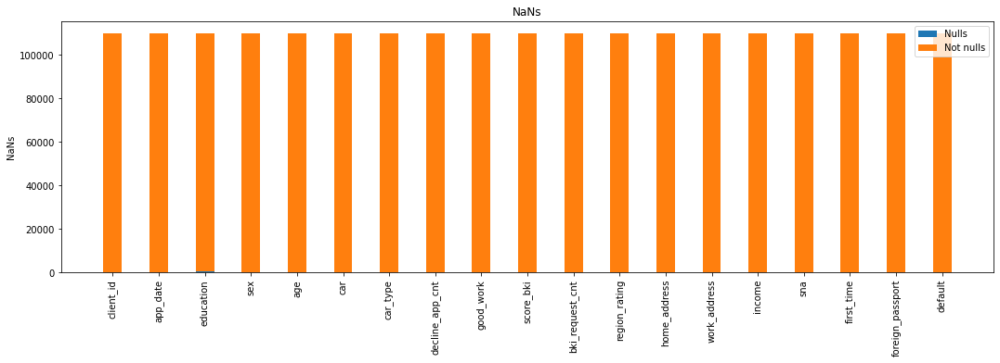

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default
0,0,0,478,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [52]:
# посмотрим количесво NaN'ов по колонкам и визуализируем
nulls = df.isnull().sum(axis=0)
nulls_df = pd.DataFrame(columns=dropped.columns)
nulls_dict = {}
for i in range(len(nulls_df.columns)):
    nulls_dict[nulls_df.columns[i]] = nulls[i]
nulls_df = nulls_df.append(nulls_dict, ignore_index=True)
show_nulls(dropped)
nulls_df

##### Как видно нули только в одной колонке и то - их исчезающе мало в %-м отношении (если не приглядыватьсся, то и не видны в колонке education), поработаем с ними чуть позже <br>  =======================================================================================================================

#### <a id='column_types'> Типы колонок </a>

##### Посмотрим на типы колонок и минимально оценим

In [53]:
dropped = df.drop(columns=['client_id', 'default', 'sample'])

In [54]:
# построим таблицу с указанием типа количества значений, их списка, и количества значений из списка
cols = []
res = pd.DataFrame(columns=('column', 'type', 'value_counts_length',
                            'values', 'value_counts', "nulls_length"))
for col in enumerate(dropped.columns):
    vc = dropped[col[1]].value_counts(dropna=False)
    vc_len = len(vc)
    if (vc_len > 8):
        vc_strings = "### too many ###"
        vc_vals = "### too many ###"
    else:
        lst_index = vc.index.tolist()
        vc_strings = ', '.join(str(e) for e in lst_index)
        lst_counts = vc.tolist()
        vc_vals = ', '.join(str(e) for e in lst_counts)
    res.loc[col[0]] = [col[1], dropped[col[1]].dtype, vc_len,
                       vc_strings, vc_vals, nulls_df.iloc[0][col[0]]]

res.sort_values(by=['value_counts_length'])

,column,type,value_counts_length,values,value_counts,nulls_length
16,foreign_passport,object,2,"N, Y","93721, 16427",0
2,sex,object,2,"F, M","61836, 48312",478
4,car,object,2,"N, Y","74290, 35858",0
5,car_type,object,2,"N, Y","89140, 21008",0
7,good_work,int64,2,"0, 1","91917, 18231",0
11,home_address,int64,3,"2, 1, 3","59591, 48688, 1869",0
12,work_address,int64,3,"3, 2, 1","67113, 30761, 12274",0
15,first_time,int64,4,"3, 4, 1, 2","46588, 28017, 18296, 17247",0
14,sna,int64,4,"1, 4, 2, 3","70681, 17481, 15832, 6154",0
1,education,object,6,"SCH, GRD, UGR, PGR, nan, ACD","57998, 34768, 14748, 1865, 478, 291",0


##### В принципе видно, какие являются явно (по факту) числовыми, какие "делают вид" что числовые, но на самом деле категориальные (ординальные), какие просто категориальные и какие бинарные

In [55]:
num_cols = []
cat_cols = []
cat_num_cols = []
bin_cols = []
date_cols = []
for i in range(len(res)):
    row = res.iloc[i]
    if (row.type == 'object'):
        if (row['value_counts_length'] == 2):
            bin_cols.append(row['column'])
        else:
            cat_cols.append(row['column'])
    elif (row.type == 'int64' or row.type == 'float64'):
        if (row['value_counts_length'] <= 8):
            cat_num_cols.append(row['column'])
        else:
            num_cols.append(row['column'])

In [56]:
print_column_by_types()

Numerical: ['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'] 
Categorial (string): ['app_date', 'education'] 
Categorial (numbers): ['good_work', 'region_rating', 'home_address', 'work_address', 'sna', 'first_time'] 
Date: [] 
Binary (string): ['sex', 'car', 'car_type', 'foreign_passport']


#### Отдельно отметим app_date, которую надо перенести в тип колонок дата. <br>В будущие задачи можно предварительно добавить попытку определения дата-колонок (если колонка без NaN'ов конвертится в дату - значит дата)

In [57]:
date_cols = ['app_date']
cat_cols.remove('app_date')

In [58]:
print_column_by_types()

Numerical: ['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'] 
Categorial (string): ['education'] 
Categorial (numbers): ['good_work', 'region_rating', 'home_address', 'work_address', 'sna', 'first_time'] 
Date: ['app_date'] 
Binary (string): ['sex', 'car', 'car_type', 'foreign_passport']


#### <a id='target_balance'> Сбалансированность классов </a>

In [59]:
query_reload()

0    64427
1     9372
Name: default, dtype: int64


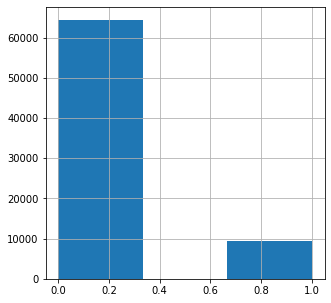

In [60]:
# оценим сбалансированность данных
train_data_naive['default'].hist(bins=3, figsize=(5, 5)),
vc_def = train_data_naive['default'].value_counts()
print(vc_def)

In [61]:
vc_def[0]/vc_def[1]

6.874413145539906

### Несбалансированность если меньше чем 1 к 10, т.е. выборка ещё как бы сбалансированная, но отношение уже чувствительное.

### <a id='naive_models'> I. Первые наивные модели </a> 
([К оглавлению](#table_of_contents))

#### <a id='primitive_preprocessing'> Первичная обработка </a>

#### Построим самую первую модель. Всё не числовое приведем к числу, на корреляцию не смотрим.

In [62]:
df.sample(3)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
106050,95072,11APR2014,GRD,F,29,N,N,0,0,-2.781706,0,80,2,3,65000,1,4,Y,1,0
108748,96732,13APR2014,GRD,M,41,N,N,2,0,-1.573190,3,80,2,3,200000,3,4,Y,1,0
12087,17304,24JAN2014,SCH,F,57,N,N,0,0,-1.676184,3,40,1,2,23000,2,2,N,0,-1


Как выяснили тут [Типы колонок](#column_types) есть числовые, категориальные/бинарные циферные, категориальные/бинарные строковые и дата. Заполним вначале нули

In [63]:
df['education'].value_counts(dropna=False)

SCH    57998
GRD    34768
UGR    14748
PGR     1865
NaN      478
ACD      291
Name: education, dtype: int64

In [64]:
# вероятность что даже в школе человек не был очень очень мала, поэтому так и заполним пропуски - самым частым и очевидным
df['education'] = df['education'].apply(lambda x: "SCH" if pd.isnull(x) else x)

In [65]:
df['education'].value_counts(dropna=False)

SCH    58476
GRD    34768
UGR    14748
PGR     1865
ACD      291
Name: education, dtype: int64

#### Переведем категориальные в численные. Вначале бинарные, потом education по нашему правилу (чтобы было ранжироване)

In [66]:
df = label_encode_cols(df, bin_cols)  # без education - он ординальный

Column sex : {0: 'F', 1: 'M'}
0    61836
1    48312
Name: sex, dtype: int64 

Column car : {0: 'N', 1: 'Y'}
0    74290
1    35858
Name: car, dtype: int64 

Column car_type : {0: 'N', 1: 'Y'}
0    89140
1    21008
Name: car_type, dtype: int64 

Column foreign_passport : {0: 'N', 1: 'Y'}
0    93721
1    16427
Name: foreign_passport, dtype: int64 



In [67]:
df[bin_cols + cat_cols].head(2)

,sex,car,car_type,foreign_passport,education
0,1,1,1,0,GRD
1,0,0,0,0,SCH


In [68]:
df.sample(3)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,sample,default
6231,79117,27MAR2014,GRD,0,33,0,0,0,0,-2.118025,3,60,1,2,15000,1,3,0,0,-1
34009,101106,18APR2014,SCH,1,59,1,1,0,1,-1.921245,6,60,2,3,60000,4,1,0,0,-1
15036,38610,14FEB2014,SCH,1,30,1,1,0,0,-1.533334,0,60,2,3,60000,1,3,1,0,-1


In [69]:
# Порядок значений в education важен!

In [70]:
# переведем в числа по порядку силы значений
edu_types = ['SCH', 'UGR', 'GRD', 'PGR', 'ACD']
l_dict = dict(zip(edu_types, range(len(edu_types))))
l_dict

{'SCH': 0, 'UGR': 1, 'GRD': 2, 'PGR': 3, 'ACD': 4}

In [71]:
df['education'] = df['education'].apply(lambda x: l_dict[x])

In [72]:
df[bin_cols + cat_cols].head(2)

,sex,car,car_type,foreign_passport,education
0,1,1,1,0,2
1,0,0,0,0,0


#### <a id='first_models'>Первые модели</a>

In [73]:
query_reload()

Model type ( 1 of 6 ) = 01_all_cat_weighted_robust
Test
acc = 0.6640 bal acc = 0.6719 F1-score = 0.3346 precision = 0.2216 recall = 0.6825
ROC AUC = 0.7395, AUC PR = 0.2794
Train
acc = 0.6656 bal acc = 0.6668 F1-score = 0.3381 precision = 0.2263 recall = 0.6684
ROC AUC = 0.7298, AUC PR = 0.2810


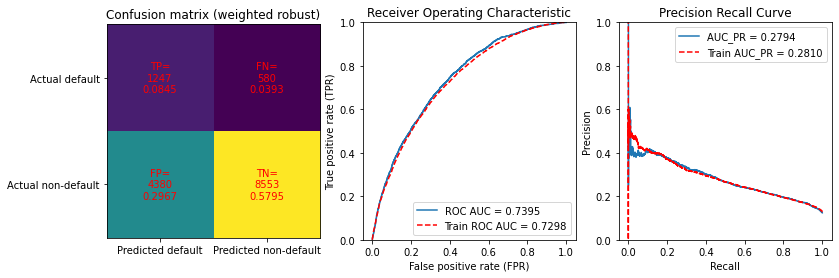

Model type ( 2 of 6 ) = 01_all_cat_weighted_minmax
Test
acc = 0.6648 bal acc = 0.6738 F1-score = 0.3362 precision = 0.2227 recall = 0.6858
ROC AUC = 0.7394, AUC PR = 0.2797
Train
acc = 0.6646 bal acc = 0.6660 F1-score = 0.3373 precision = 0.2256 recall = 0.6679
ROC AUC = 0.7297, AUC PR = 0.2810


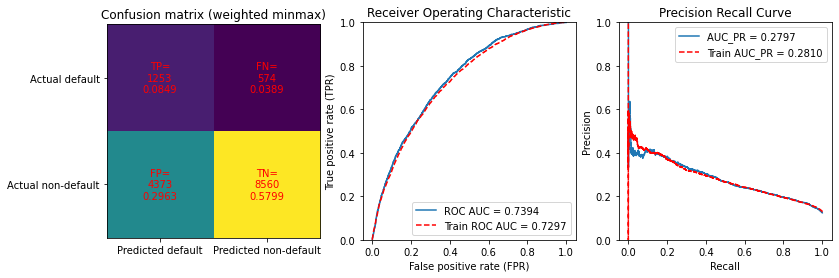

Model type ( 3 of 6 ) = 01_all_cat_weighted_standart
Test
acc = 0.6641 bal acc = 0.6720 F1-score = 0.3347 precision = 0.2217 recall = 0.6825
ROC AUC = 0.7395, AUC PR = 0.2794
Train
acc = 0.6656 bal acc = 0.6667 F1-score = 0.3381 precision = 0.2263 recall = 0.6683
ROC AUC = 0.7298, AUC PR = 0.2810


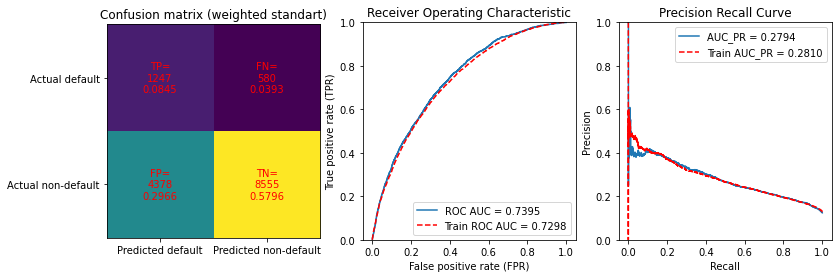

Model type ( 4 of 6 ) = 01_all_cat_imbalanced_robust
Test
acc = 0.8749 bal acc = 0.5082 F1-score = 0.0395 precision = 0.3958 recall = 0.0208
ROC AUC = 0.7399, AUC PR = 0.2806
Train
acc = 0.8719 bal acc = 0.5107 F1-score = 0.0483 precision = 0.4800 recall = 0.0254
ROC AUC = 0.7294, AUC PR = 0.2816


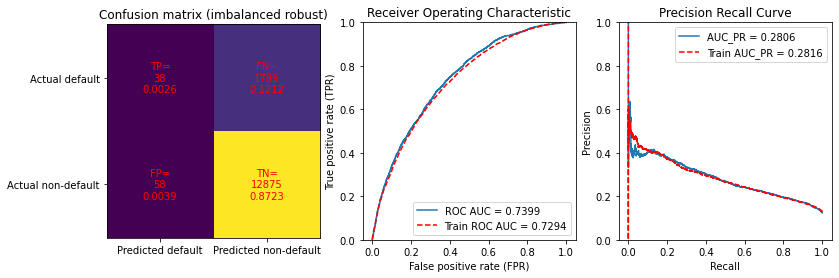

Model type ( 5 of 6 ) = 01_all_cat_imbalanced_minmax
Test
acc = 0.8748 bal acc = 0.5069 F1-score = 0.0345 precision = 0.3793 recall = 0.0181
ROC AUC = 0.7397, AUC PR = 0.2806
Train
acc = 0.8719 bal acc = 0.5098 F1-score = 0.0442 precision = 0.4795 recall = 0.0232
ROC AUC = 0.7291, AUC PR = 0.2814


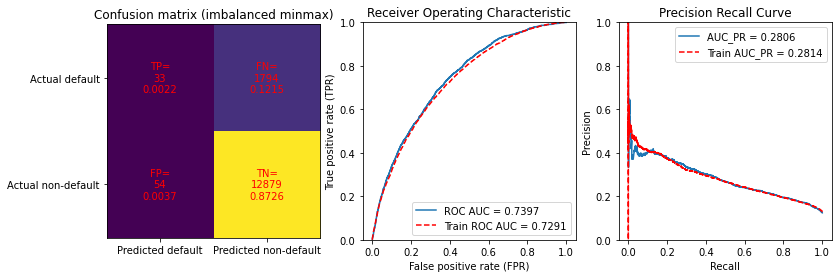

Model type ( 6 of 6 ) = 01_all_cat_imbalanced_standart
Test
acc = 0.8749 bal acc = 0.5082 F1-score = 0.0395 precision = 0.3958 recall = 0.0208
ROC AUC = 0.7399, AUC PR = 0.2806
Train
acc = 0.8719 bal acc = 0.5107 F1-score = 0.0483 precision = 0.4788 recall = 0.0254
ROC AUC = 0.7294, AUC PR = 0.2816


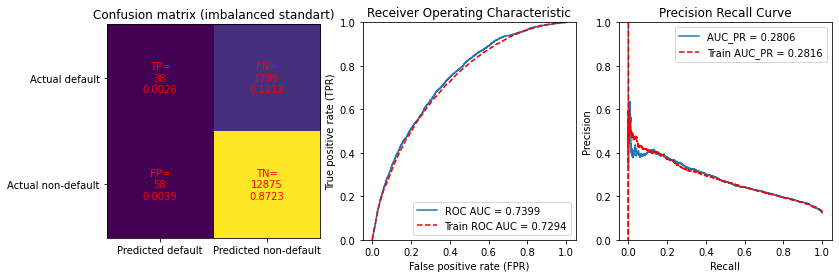

In [74]:
models01 = test_model_variants_params(train_data_naive, num_cols, cat_cols +
                                      cat_num_cols, bin_cols, "01_all_cat", scalers_global, balanced_types_global)
models_dict.update(models01)
save_all_models_submission(test_data_naive, num_cols,
                           cat_cols+cat_num_cols, bin_cols, models01)

Model type ( 1 of 6 ) = 02_cat_num_weighted_robust
Test
acc = 0.6702 bal acc = 0.6724 F1-score = 0.3364 precision = 0.2240 recall = 0.6754
ROC AUC = 0.7366, AUC PR = 0.2742
Train
acc = 0.6652 bal acc = 0.6647 F1-score = 0.3364 precision = 0.2252 recall = 0.6640
ROC AUC = 0.7269, AUC PR = 0.2771


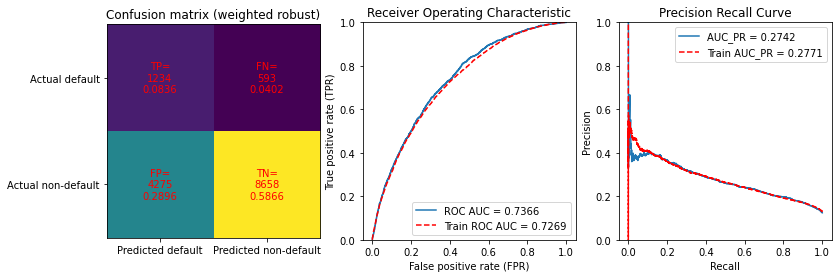

Model type ( 2 of 6 ) = 02_cat_num_weighted_minmax


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Test
acc = 0.6703 bal acc = 0.6739 F1-score = 0.3376 precision = 0.2247 recall = 0.6787
ROC AUC = 0.7365, AUC PR = 0.2739
Train
acc = 0.6643 bal acc = 0.6640 F1-score = 0.3357 precision = 0.2247 recall = 0.6636
ROC AUC = 0.7265, AUC PR = 0.2766


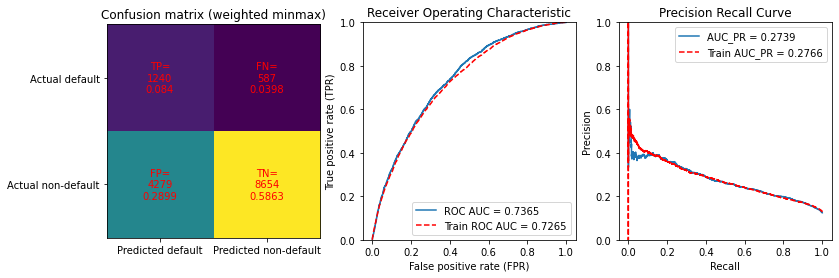

Model type ( 3 of 6 ) = 02_cat_num_weighted_standart
Test
acc = 0.6701 bal acc = 0.6724 F1-score = 0.3364 precision = 0.2240 recall = 0.6754
ROC AUC = 0.7367, AUC PR = 0.2742
Train
acc = 0.6651 bal acc = 0.6644 F1-score = 0.3362 precision = 0.2251 recall = 0.6635
ROC AUC = 0.7269, AUC PR = 0.2771


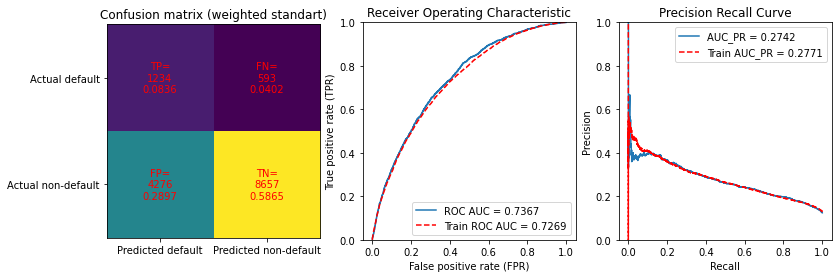

Model type ( 4 of 6 ) = 02_cat_num_imbalanced_robust
Test
acc = 0.8747 bal acc = 0.5076 F1-score = 0.0375 precision = 0.3789 recall = 0.0197
ROC AUC = 0.7368, AUC PR = 0.2748
Train
acc = 0.8719 bal acc = 0.5105 F1-score = 0.0476 precision = 0.4761 recall = 0.0250
ROC AUC = 0.7265, AUC PR = 0.2773


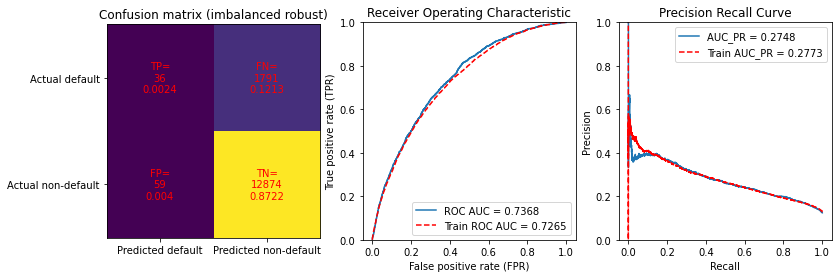

Model type ( 5 of 6 ) = 02_cat_num_imbalanced_minmax


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Test
acc = 0.8748 bal acc = 0.5072 F1-score = 0.0355 precision = 0.3820 recall = 0.0186
ROC AUC = 0.7364, AUC PR = 0.2741
Train
acc = 0.8719 bal acc = 0.5091 F1-score = 0.0413 precision = 0.4780 recall = 0.0216
ROC AUC = 0.7258, AUC PR = 0.2765


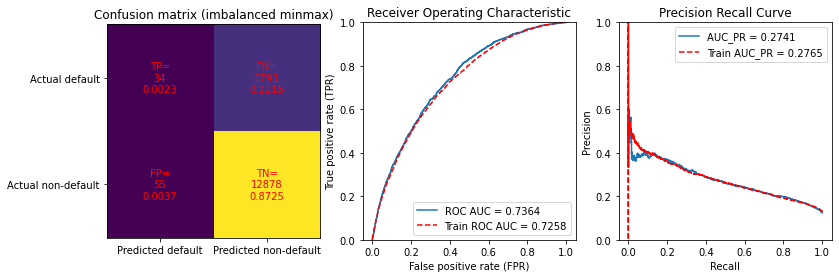

Model type ( 6 of 6 ) = 02_cat_num_imbalanced_standart
Test
acc = 0.8747 bal acc = 0.5076 F1-score = 0.0375 precision = 0.3789 recall = 0.0197
ROC AUC = 0.7368, AUC PR = 0.2748
Train
acc = 0.8719 bal acc = 0.5105 F1-score = 0.0476 precision = 0.4761 recall = 0.0250
ROC AUC = 0.7265, AUC PR = 0.2773


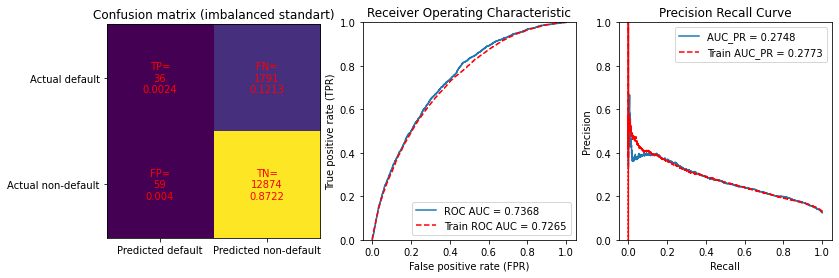

In [75]:
# 2. вариант 2 - категориальные как числовые
models02 = test_model_variants_params(train_data_naive, num_cols, [
], cat_cols+cat_num_cols+bin_cols, "02_cat_num", scalers_global, balanced_types_global)
models_dict.update(models02)
save_all_models_submission(test_data_naive, num_cols,
                           [], cat_cols+cat_num_cols+bin_cols, models02)

#### <a id='graph12'>Графики показателей</a>

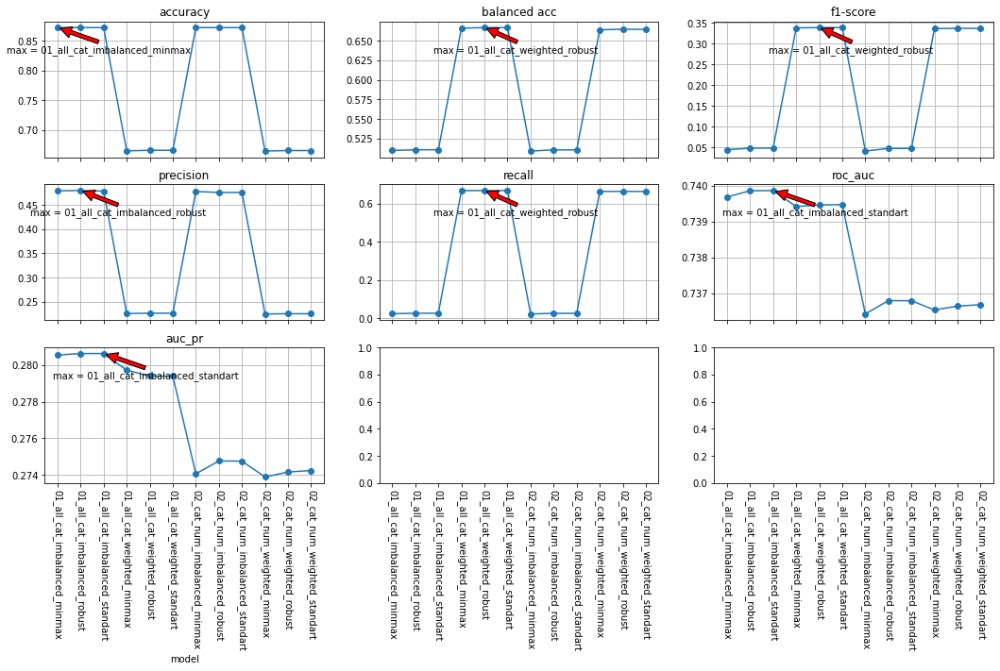

In [76]:
visualize_models(models_dict)

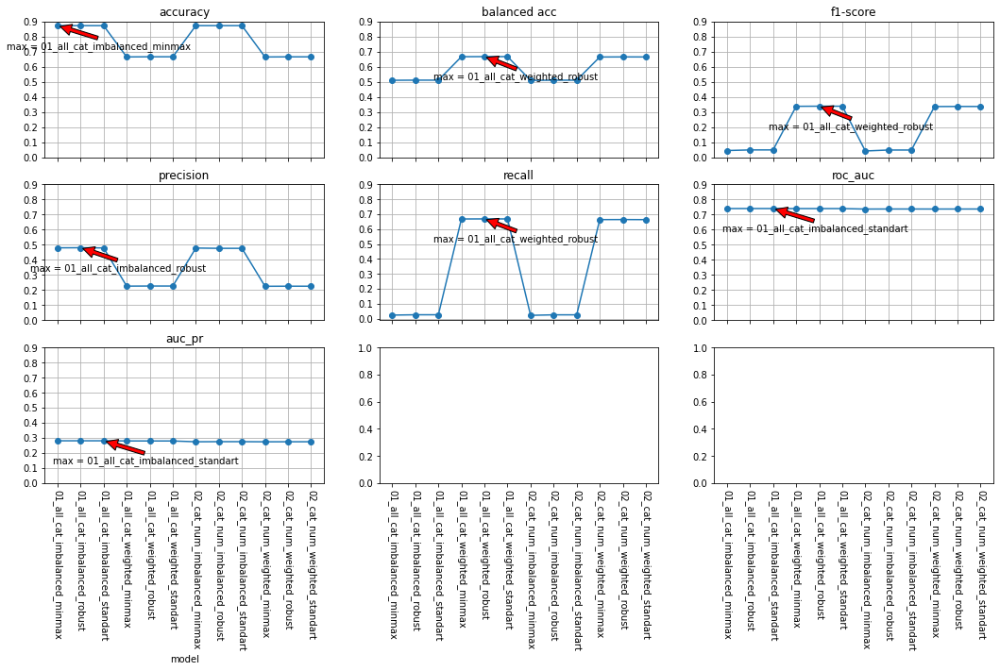

In [77]:
visualize_models(models_dict, set01=True)

### Как видим:<br> 1) при использовании категориальных признаков как числовых AUC_ROC и PR_ROC всегда хуже; <br> 2) recall и precision не очень так как FN и FP относительно большие;<br>3) как следствие не очень и f1-score;<br>4) balanced accuracy и f1-score очевидно проседает на несбалансированных моделях; <br> 5) recall очень мал на несбалансированных моделях т.к. FN получается слишком большой.

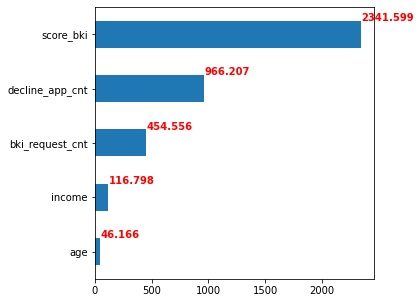

In [78]:
# посмотрим заодно на важность признаков сразу
# вначале числовые, смотрим тут так как f_classif
f_classif_by_cols(train_data_naive, num_cols)

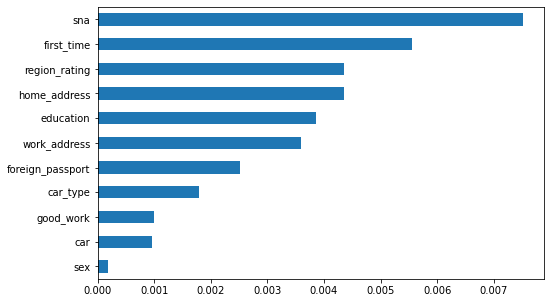

In [79]:
# потом категориальные
mutual_info_classif_by_cols(
    train_data_naive, bin_cols + cat_cols + cat_num_cols)

### <a id='numerical_2'>II. Исследование. Часть 1. Числовые признаки </a> 
([К оглавлению](#table_of_contents))

#### <a id='num_research'>Изучение признаков</a>

In [80]:
# вспомним типы
print_column_by_types()

Numerical: ['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'] 
Categorial (string): ['education'] 
Categorial (numbers): ['good_work', 'region_rating', 'home_address', 'work_address', 'sna', 'first_time'] 
Date: ['app_date'] 
Binary (string): ['sex', 'car', 'car_type', 'foreign_passport']


#### Посмотрим на признаки. Рисуем и distplot и гистограмму сразу хотя они и похожи: смотрим на большую и меньшую детальность.

### Age

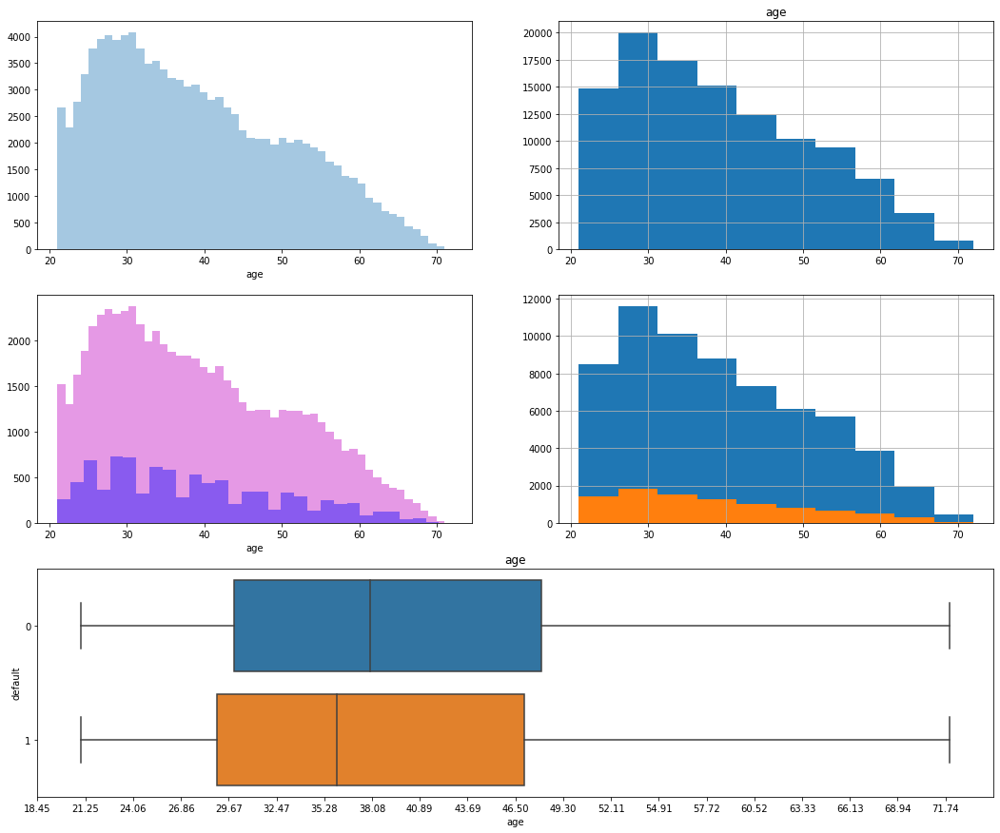

In [81]:
draw_all_plots_for_1feat(train_data_naive, df,  'age', 'default')

##### Данные выглядят достаточно похоже во всех вариантах.<br> Кажется что дефолтные клиенты в среднем младше, но надо помнить про относительную несбалансированность выборки. <br> Выбросов нет.

### decline_app_cnt

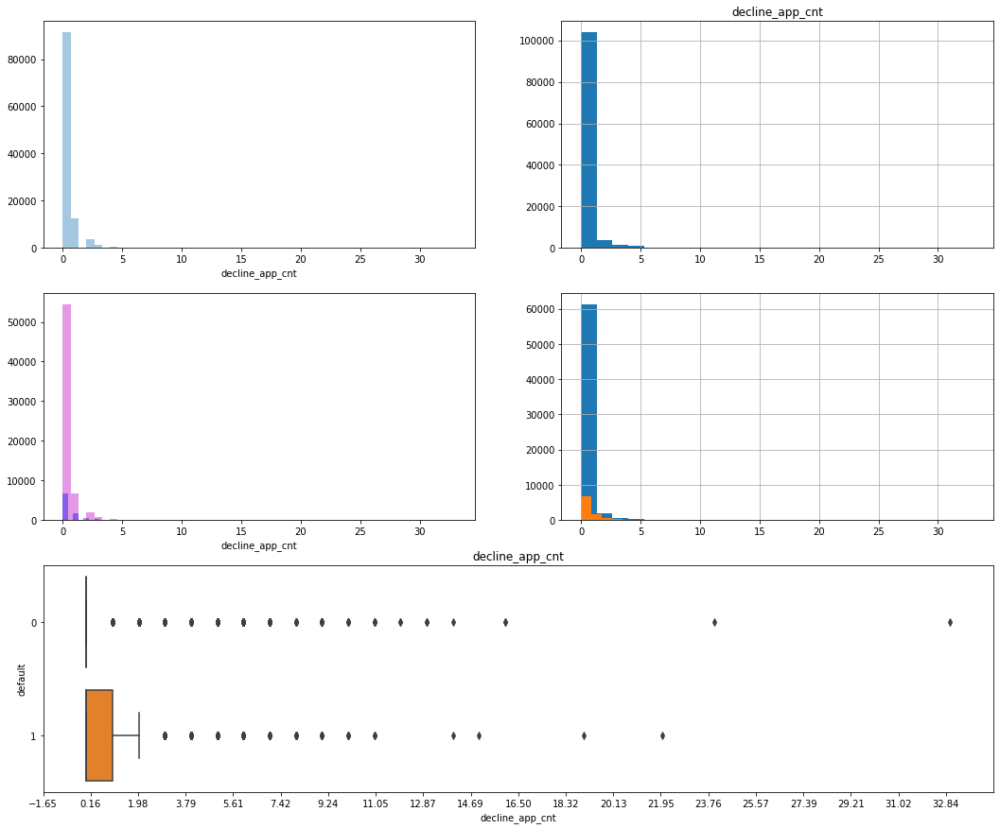

In [82]:
draw_all_plots_for_1feat(train_data_naive, df,
                         'decline_app_cnt', 'default', bins_cnt=25)

#### Теоретически много выбросов, по факту слишком много значений 0. Остальное выглядит редким случаем, но не выбросом. <br> Отлогарифмируем и посмотрим ещё раз.

In [83]:
df['decline_app_cnt'] = df['decline_app_cnt'].apply(lambda w: np.log(w + 1))

In [84]:
query_reload()

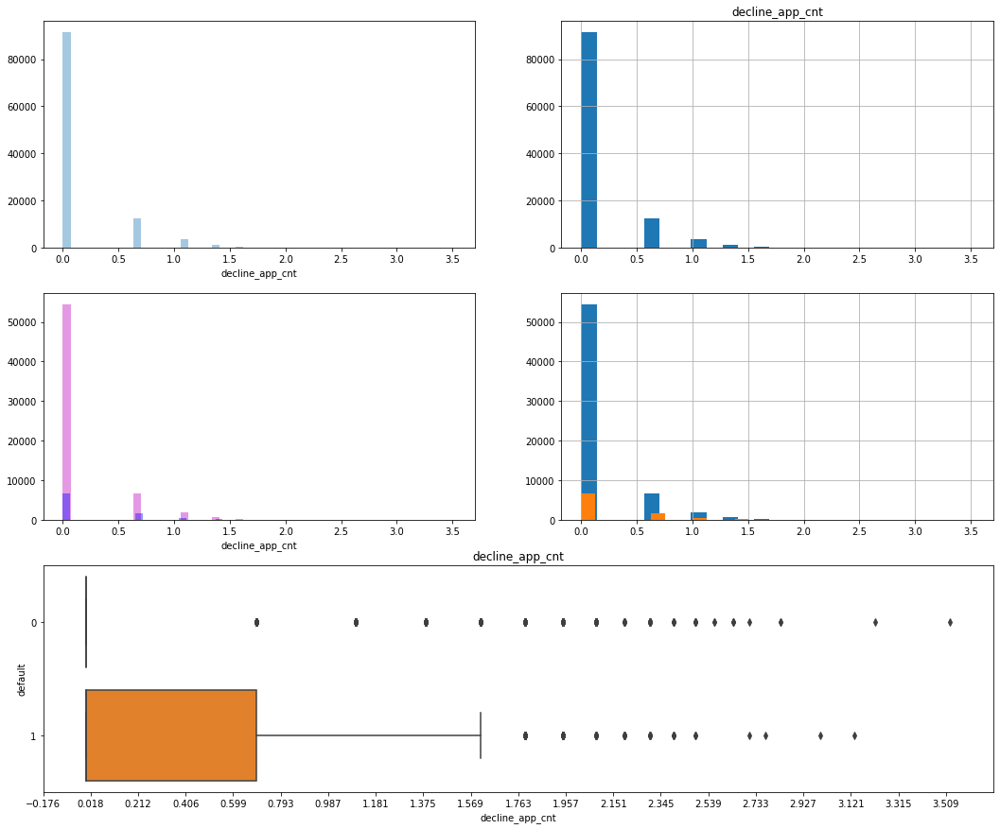

In [85]:
draw_all_plots_for_1feat(train_data_naive, df,
                         'decline_app_cnt', 'default', bins_cnt=25)

#### В целом ясно и логично, что дефолтные клиенты имеют гораздо больше отклоненных заявок.

### score_bki

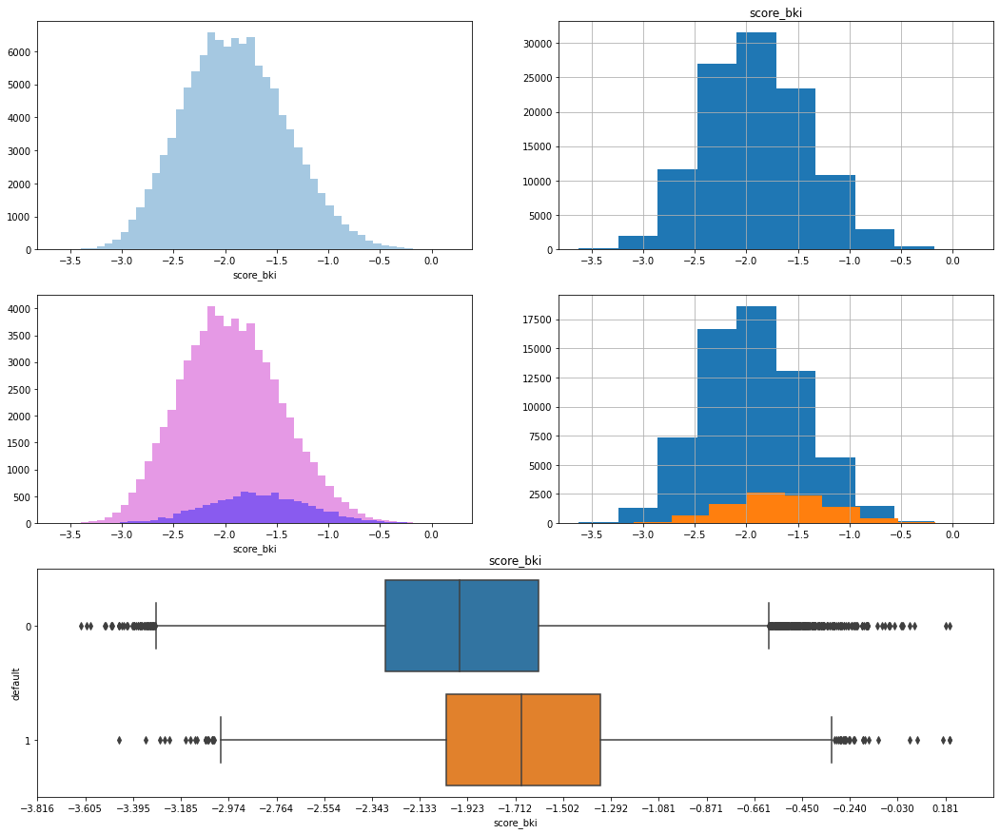

In [86]:
draw_all_plots_for_1feat(train_data_naive, df,  'score_bki', 'default')

In [87]:
df['score_bki'].describe()

count    110148.000000
mean         -1.904535
std           0.499397
min          -3.624586
25%          -2.260434
50%          -1.920823
75%          -1.567888
max           0.199773
Name: score_bki, dtype: float64

In [88]:
print('score_bki interval width =',
      df['score_bki'].max()-df['score_bki'].min())

score_bki interval width = 3.82435917


In [89]:
print('delta mean\'s =', train_data_naive[train_data_naive.default == 1]['score_bki'].mean(
)-train_data_naive[train_data_naive.default == 0]['score_bki'].mean())

delta mean's = 0.2624110370357209


#### Параметр кажется нормально распределенным, хвосты выглядят аккуратно, выбросы формально есть, но опять же - выглядит вроде логично, ничего делать не будем.<br> Кажется, что у дефолтных клиентов score_bki побольше: <br> значения в интервале размером 3.82, разница средних дефолтных и недфолтных 0.26.

### bki_request_cnt

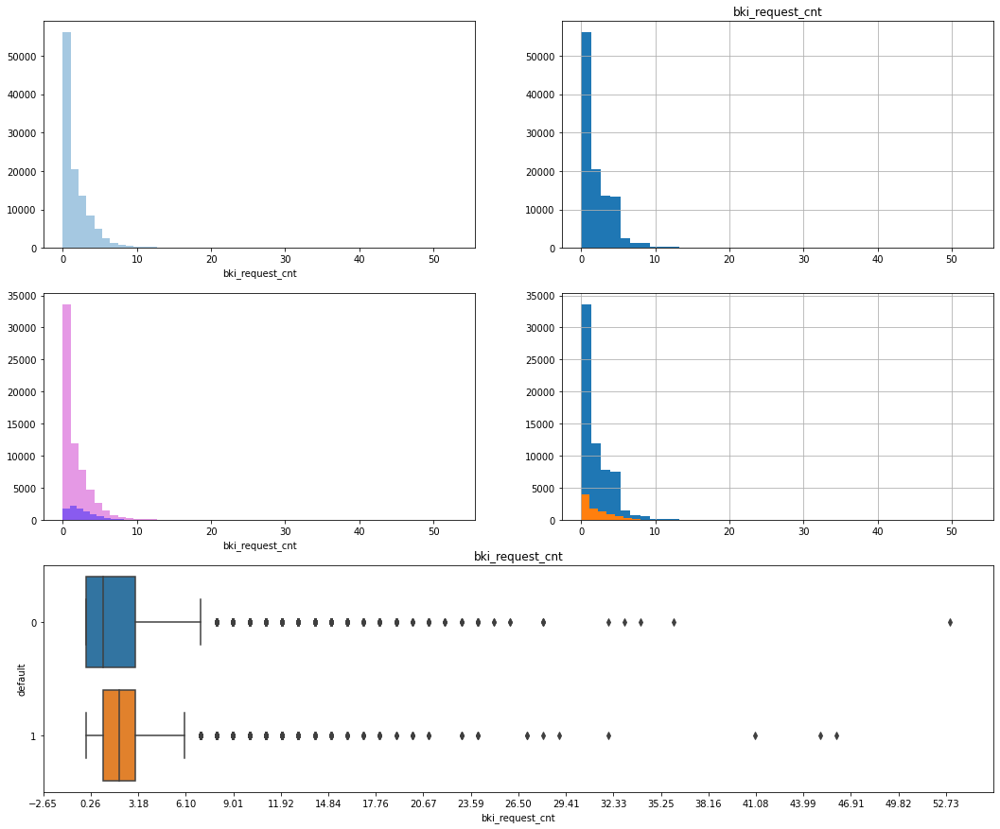

In [90]:
draw_all_plots_for_1feat(train_data_naive, df,
                         'bki_request_cnt', 'default', bins_cnt=40)

#### Ситуация с выбросами похожа на предыдущие, пока ничего делать не будем. Отлогарифмируем и посмотрим ещё раз.

In [91]:
df['bki_request_cnt'] = df['bki_request_cnt'].apply(lambda w: np.log(w + 1))

In [92]:
query_reload()

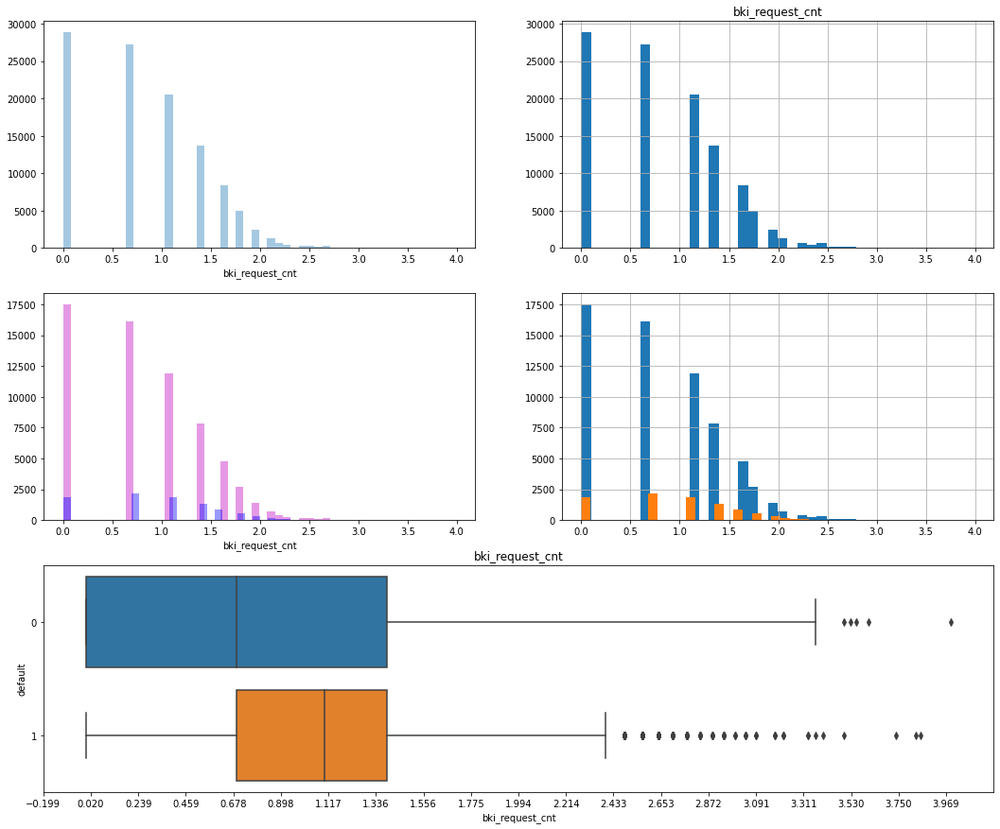

In [93]:
draw_all_plots_for_1feat(train_data_naive, df,
                         'bki_request_cnt', 'default', bins_cnt=40)

#### Стало лучше видно, что в среднем у дефолтных количество запросов в БКИ явно больше.

### income

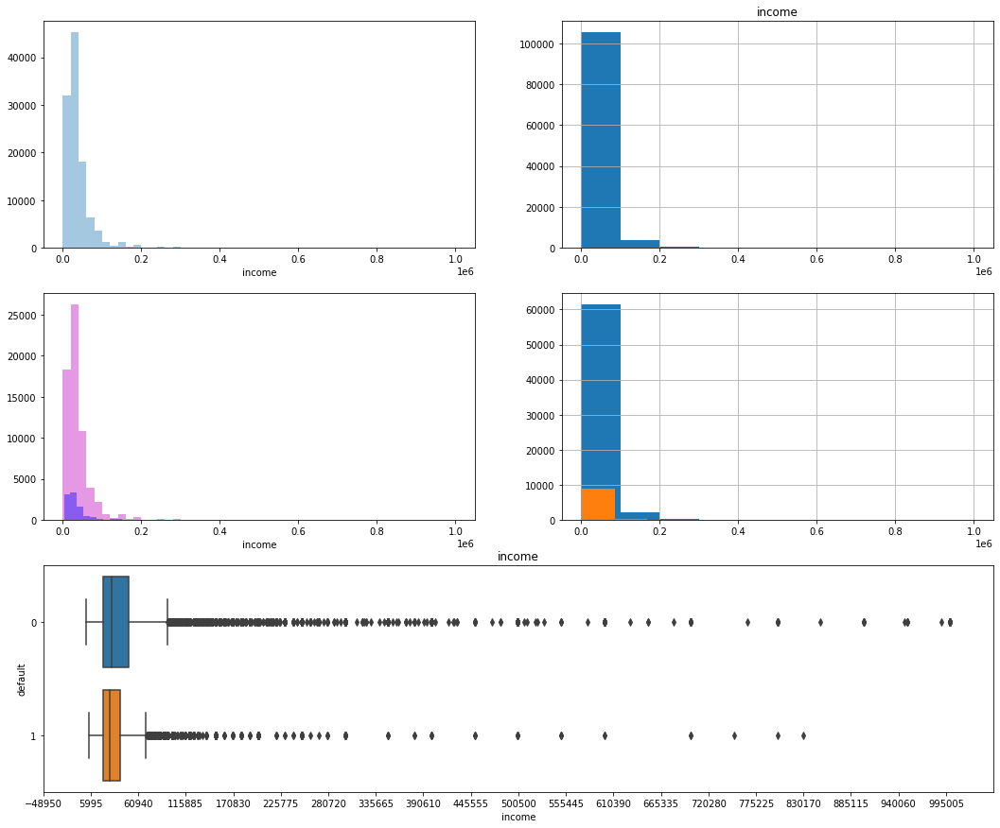

In [94]:
draw_all_plots_for_1feat(train_data_naive, df,  'income', 'default')

#### Опять та же ситуация с выбросами (даже более логично-объяснимая - параметр дохода более понятен сам по себе). Отлогарифмируем и посмотрим ещё раз.

In [95]:
df['income'] = df['income'].apply(lambda w: np.log(w + 1))

In [96]:
query_reload()

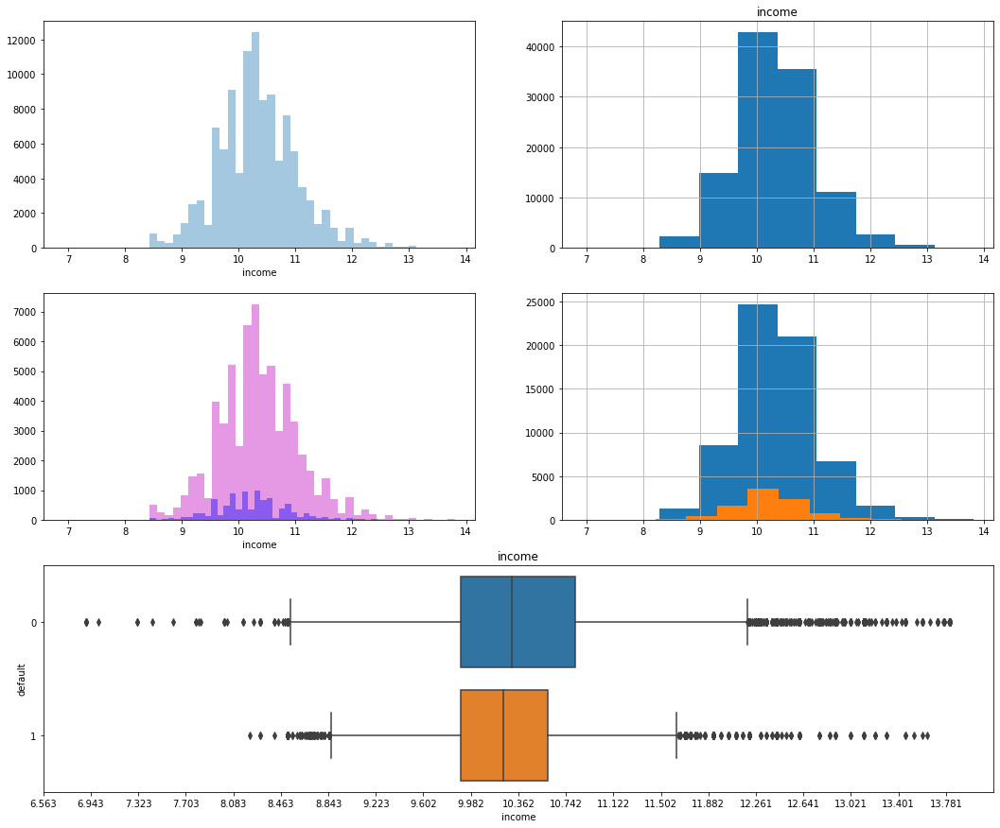

In [97]:
draw_all_plots_for_1feat(train_data_naive, df,  'income', 'default')

#### Стало видно ещё лучше, что доход у не-дефолтных в среднем выше.

### <a id='naive_3'>III. Построим наивные модели ещё раз теперь </a> 
([К оглавлению](#table_of_contents))

In [98]:
query_reload()

Model type ( 1 of 6 ) = 03_all_cat_log_weighted_robust
Test
acc = 0.6657 bal acc = 0.6750 F1-score = 0.3373 precision = 0.2235 recall = 0.6875
ROC AUC = 0.7416, AUC PR = 0.2837
Train
acc = 0.6652 bal acc = 0.6677 F1-score = 0.3387 precision = 0.2265 recall = 0.6710
ROC AUC = 0.7307, AUC PR = 0.2833


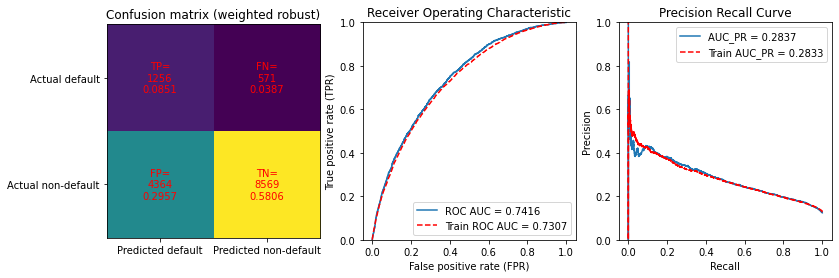

Model type ( 2 of 6 ) = 03_all_cat_log_weighted_minmax
Test
acc = 0.6660 bal acc = 0.6750 F1-score = 0.3374 precision = 0.2236 recall = 0.6869
ROC AUC = 0.7416, AUC PR = 0.2836
Train
acc = 0.6653 bal acc = 0.6678 F1-score = 0.3389 precision = 0.2266 recall = 0.6713
ROC AUC = 0.7307, AUC PR = 0.2833


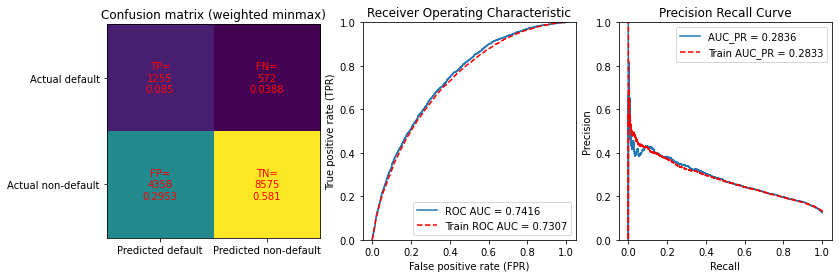

Model type ( 3 of 6 ) = 03_all_cat_log_weighted_standart
Test
acc = 0.6657 bal acc = 0.6750 F1-score = 0.3373 precision = 0.2235 recall = 0.6875
ROC AUC = 0.7416, AUC PR = 0.2837
Train
acc = 0.6652 bal acc = 0.6677 F1-score = 0.3387 precision = 0.2265 recall = 0.6710
ROC AUC = 0.7307, AUC PR = 0.2833


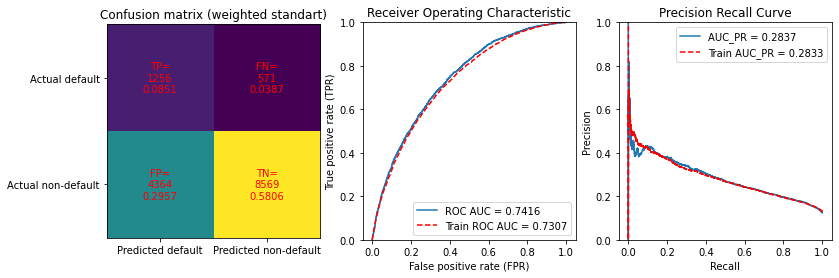

Model type ( 4 of 6 ) = 03_all_cat_log_imbalanced_robust
Test
acc = 0.8754 bal acc = 0.5087 F1-score = 0.0407 precision = 0.4333 recall = 0.0213
ROC AUC = 0.7421, AUC PR = 0.2840
Train
acc = 0.8720 bal acc = 0.5114 F1-score = 0.0512 precision = 0.4846 recall = 0.0270
ROC AUC = 0.7306, AUC PR = 0.2840


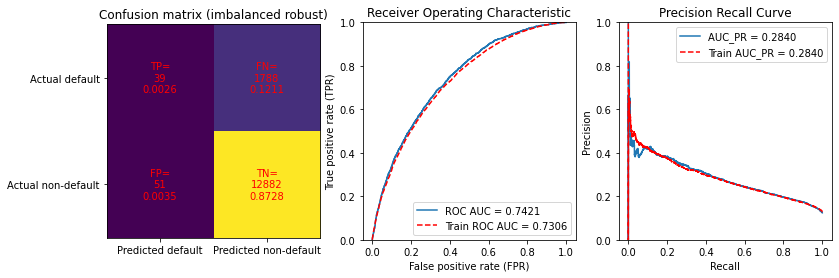

Model type ( 5 of 6 ) = 03_all_cat_log_imbalanced_minmax
Test
acc = 0.8754 bal acc = 0.5087 F1-score = 0.0407 precision = 0.4333 recall = 0.0213
ROC AUC = 0.7421, AUC PR = 0.2839
Train
acc = 0.8720 bal acc = 0.5111 F1-score = 0.0500 precision = 0.4830 recall = 0.0264
ROC AUC = 0.7306, AUC PR = 0.2840


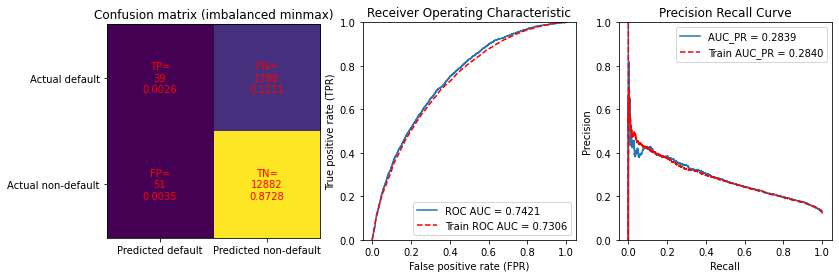

Model type ( 6 of 6 ) = 03_all_cat_log_imbalanced_standart
Test
acc = 0.8754 bal acc = 0.5087 F1-score = 0.0407 precision = 0.4333 recall = 0.0213
ROC AUC = 0.7421, AUC PR = 0.2840
Train
acc = 0.8720 bal acc = 0.5114 F1-score = 0.0512 precision = 0.4846 recall = 0.0270
ROC AUC = 0.7306, AUC PR = 0.2840


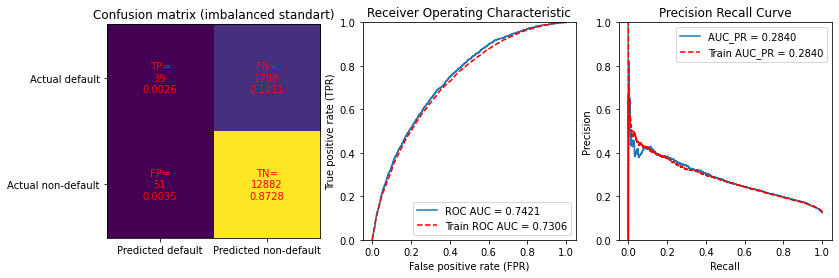

In [99]:
models03 = test_model_variants_params(train_data_naive, num_cols, cat_cols +
                                      cat_num_cols, bin_cols, "03_all_cat_log", scalers_global, balanced_types_global)
models_dict.update(models03)
save_all_models_submission(test_data_naive, num_cols,
                           cat_cols+cat_num_cols, bin_cols, models03)

Model type ( 1 of 6 ) = 04_cat_num_log_weighted_robust
Test
acc = 0.6685 bal acc = 0.6729 F1-score = 0.3364 precision = 0.2236 recall = 0.6787
ROC AUC = 0.7389, AUC PR = 0.2773
Train
acc = 0.6645 bal acc = 0.6648 F1-score = 0.3363 precision = 0.2251 recall = 0.6651
ROC AUC = 0.7278, AUC PR = 0.2795


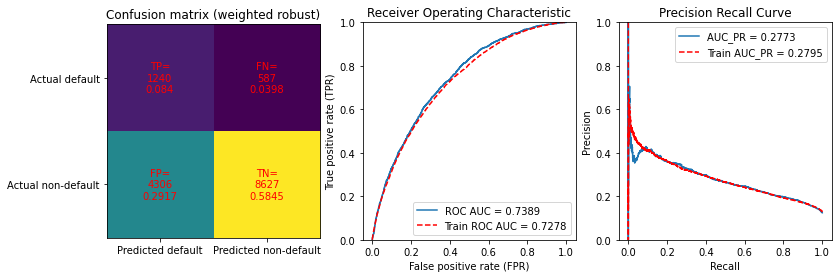

Model type ( 2 of 6 ) = 04_cat_num_log_weighted_minmax
Test
acc = 0.6683 bal acc = 0.6728 F1-score = 0.3362 precision = 0.2235 recall = 0.6787
ROC AUC = 0.7389, AUC PR = 0.2772
Train
acc = 0.6641 bal acc = 0.6650 F1-score = 0.3364 precision = 0.2250 recall = 0.6663
ROC AUC = 0.7277, AUC PR = 0.2794


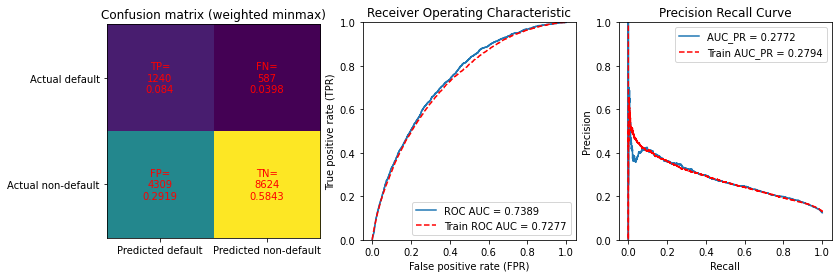

Model type ( 3 of 6 ) = 04_cat_num_log_weighted_standart
Test
acc = 0.6683 bal acc = 0.6725 F1-score = 0.3360 precision = 0.2234 recall = 0.6782
ROC AUC = 0.7389, AUC PR = 0.2773
Train
acc = 0.6643 bal acc = 0.6648 F1-score = 0.3363 precision = 0.2250 recall = 0.6656
ROC AUC = 0.7278, AUC PR = 0.2794


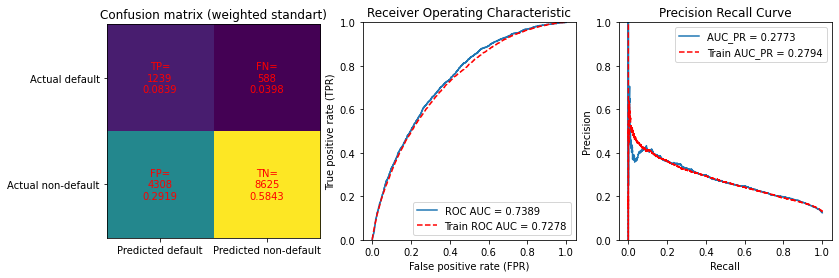

Model type ( 4 of 6 ) = 04_cat_num_log_imbalanced_robust
Test
acc = 0.8751 bal acc = 0.5083 F1-score = 0.0396 precision = 0.4086 recall = 0.0208
ROC AUC = 0.7390, AUC PR = 0.2775
Train
acc = 0.8721 bal acc = 0.5113 F1-score = 0.0506 precision = 0.4939 recall = 0.0266
ROC AUC = 0.7277, AUC PR = 0.2798


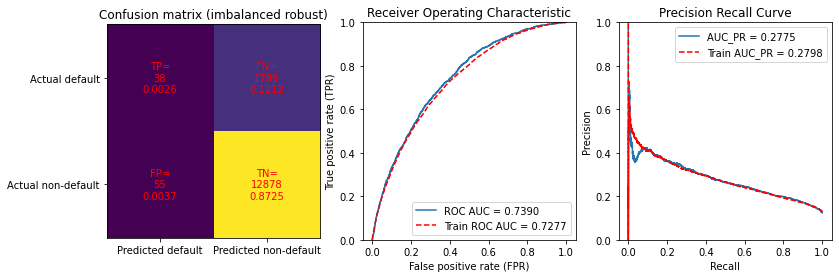

Model type ( 5 of 6 ) = 04_cat_num_log_imbalanced_minmax
Test
acc = 0.8751 bal acc = 0.5083 F1-score = 0.0396 precision = 0.4130 recall = 0.0208
ROC AUC = 0.7391, AUC PR = 0.2774
Train
acc = 0.8721 bal acc = 0.5110 F1-score = 0.0494 precision = 0.4949 recall = 0.0260
ROC AUC = 0.7277, AUC PR = 0.2799


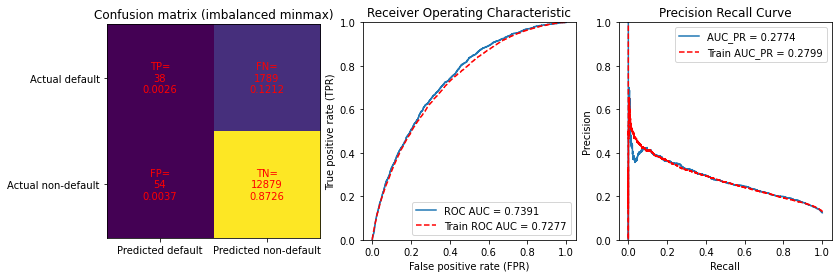

Model type ( 6 of 6 ) = 04_cat_num_log_imbalanced_standart
Test
acc = 0.8751 bal acc = 0.5083 F1-score = 0.0396 precision = 0.4086 recall = 0.0208
ROC AUC = 0.7390, AUC PR = 0.2775
Train
acc = 0.8721 bal acc = 0.5113 F1-score = 0.0505 precision = 0.4891 recall = 0.0266
ROC AUC = 0.7277, AUC PR = 0.2798


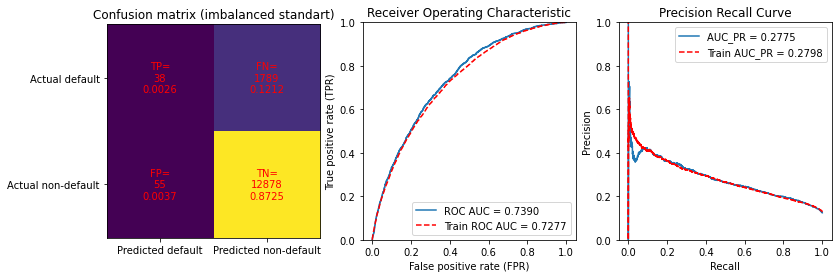

In [100]:
models04 = test_model_variants_params(train_data_naive, num_cols, [
], cat_cols+cat_num_cols+bin_cols, "04_cat_num_log", scalers_global, balanced_types_global)
models_dict.update(models04)
save_all_models_submission(test_data_naive, num_cols,
                           [], cat_cols+cat_num_cols+bin_cols, models04)

#### <a id='graph1234'> Графики показателей</a>

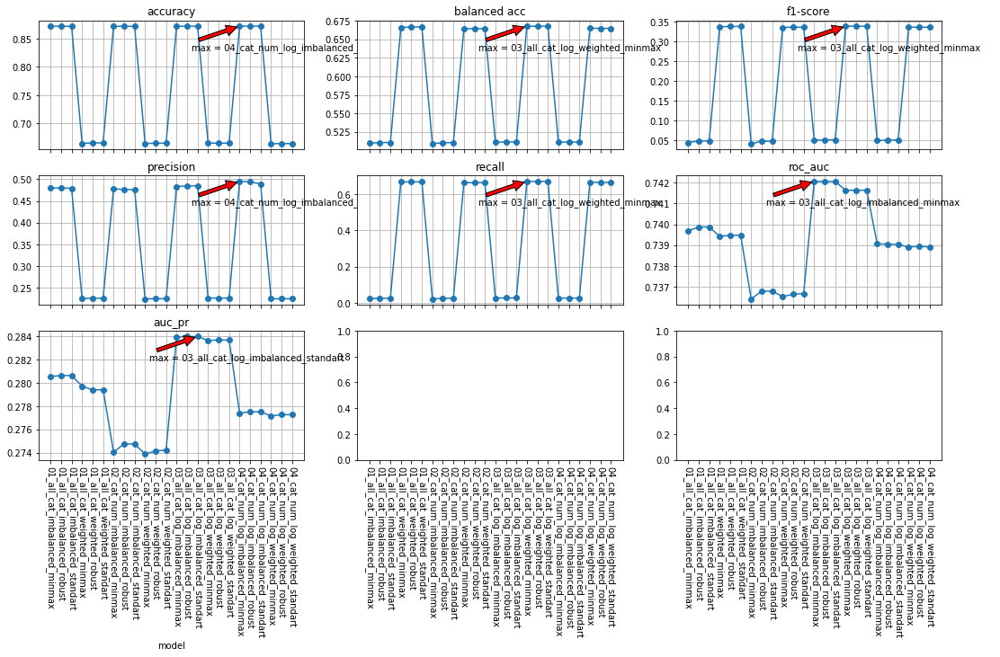

In [101]:
visualize_models(models_dict)

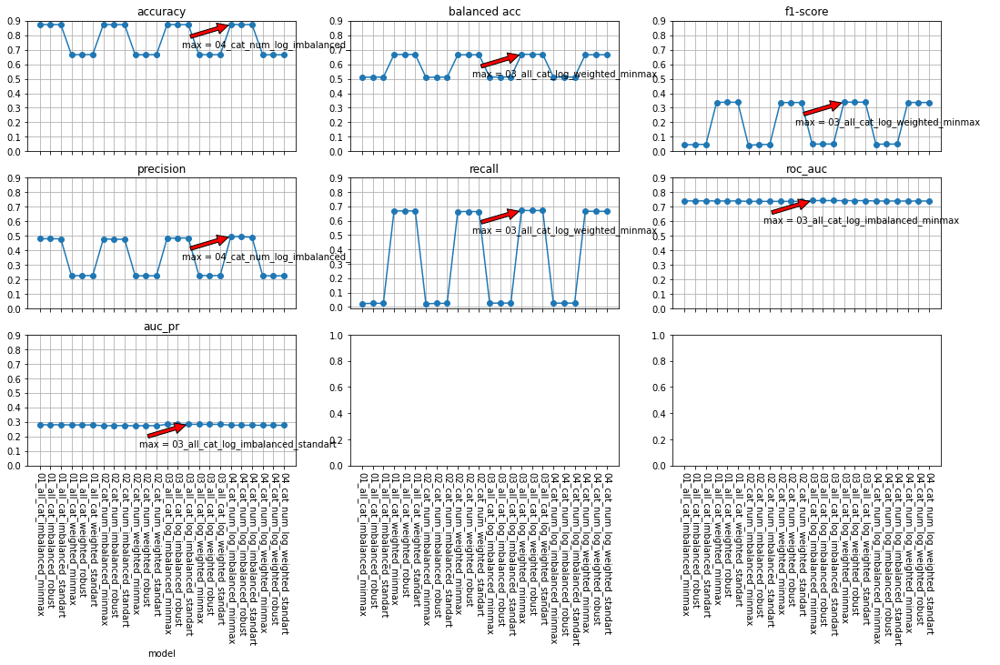

In [102]:
visualize_models(models_dict, set01=True)

### Пока что вариант 3 лучший по  ROC AUC, а также кажется, что стоит пока отказаться от попыток рассмотрения качественных как численных. Удалим их эти варианты, чтобы не мешали. При этом надо помнить, что precision и accuracy упадут(

In [103]:
del_by_key_subst("cat_num")

### Также пока перестанем рассматривать weighted вариант по тем же причинам.  Удалим их и посмотрим на более понятный график.

In [104]:
del_by_key_subst("weighted")

In [105]:
# в дальнейшем пока не смотрим weighted
balanced_types_global = ['imbalanced']

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
01_all_cat_imbalanced_minmax,0.871949,0.509752,0.044248,0.479452,0.023194,0.739689,0.280552
01_all_cat_imbalanced_robust,0.871932,0.510704,0.048332,0.480000,0.025447,0.739863,0.280631
01_all_cat_imbalanced_standart,0.871915,0.510694,0.048326,0.478803,0.025447,0.739869,0.280633
03_all_cat_log_imbalanced_minmax,0.871966,0.511119,0.050019,0.483010,0.026375,0.742057,0.283947
03_all_cat_log_imbalanced_robust,0.871983,0.511412,0.051218,0.484561,0.027038,0.742053,0.283975
03_all_cat_log_imbalanced_standart,0.871983,0.511412,0.051218,0.484561,0.027038,0.742054,0.283978


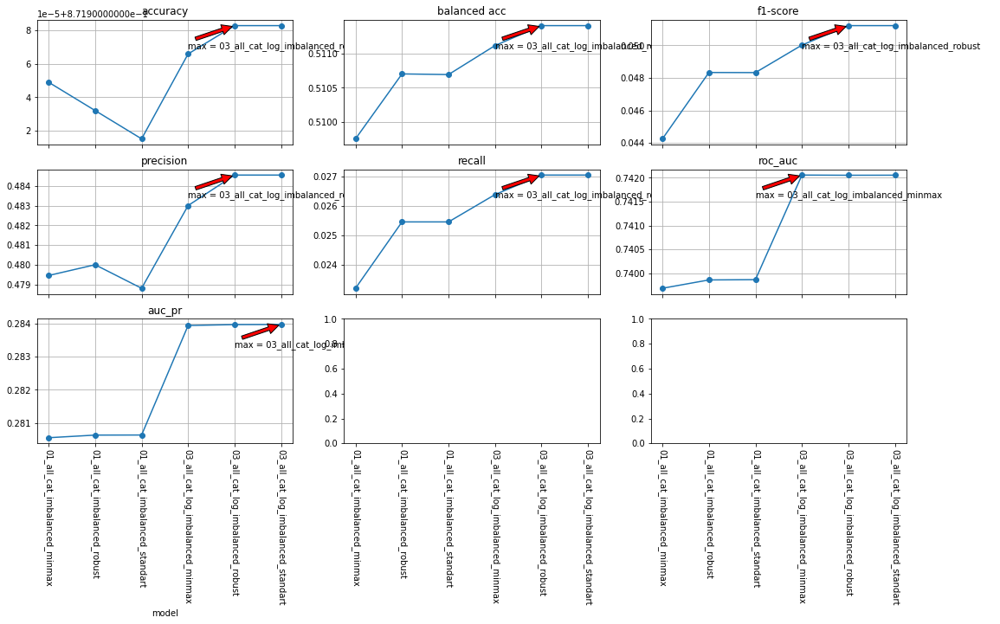

In [106]:
visualize_models(models_dict, should_return_df_=True)

### Видим, что на первом этапе MinMaxScaler был хуже, а после логарифмирования стал в целом на том же уровне.

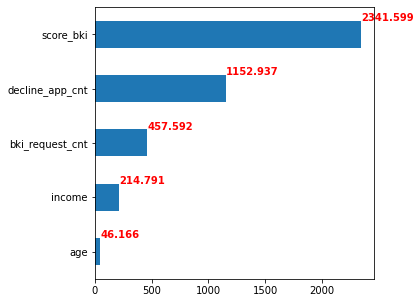

In [107]:
# ещё раз посмотрим на важность признаков
# смотрим тут так как f_classif
f_classif_by_cols(train_data_naive, num_cols)

##### Влияние income вдвое увеличилось, decline_app_cnt на десятую, остальное +/- так же.

### <a id='date_4'>IV. Исследование. Часть 2. Дата </a> 
([К оглавлению](#table_of_contents))

In [108]:
print_column_by_types()

Numerical: ['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'] 
Categorial (string): ['education'] 
Categorial (numbers): ['good_work', 'region_rating', 'home_address', 'work_address', 'sna', 'first_time'] 
Date: ['app_date'] 
Binary (string): ['sex', 'car', 'car_type', 'foreign_passport']


In [109]:
# переведем все в дату
df['dt'] = pd.to_datetime(df['app_date'])

In [110]:
df['dt'].head(2)

0   2014-03-22
1   2014-01-24
Name: dt, dtype: datetime64[ns]

In [111]:
# посмотрим на значения
vc_date = df['dt'].value_counts().sort_index()
vc_date

2014-01-01     56
2014-01-02    204
2014-01-03    313
2014-01-04    447
2014-01-05    425
             ... 
2014-04-26    643
2014-04-27    497
2014-04-28    878
2014-04-29    546
2014-04-30    865
Name: dt, Length: 120, dtype: int64

#### Видим что все даты в промежутке от 1 января 2014 по 30 апреля 2014. <br> Сохраним и посмотрим на календарь

![Calendar2014quarter1](http://um-ogorod.ru/images/ovsem026.jpg)
![](http://um-ogorod.ru/images/ovsem027.jpg)

#### Определим функцию и переведем в численный признак.

In [112]:
def app_date_to_int(x):
    return (1+(x-vc_date.index[0]).days)

In [113]:
df['app_date'] = df['dt'].apply(lambda x: app_date_to_int(x))

In [114]:
df['app_date'].head(2)

0    81
1    24
Name: app_date, dtype: int64

In [115]:
query_reload()

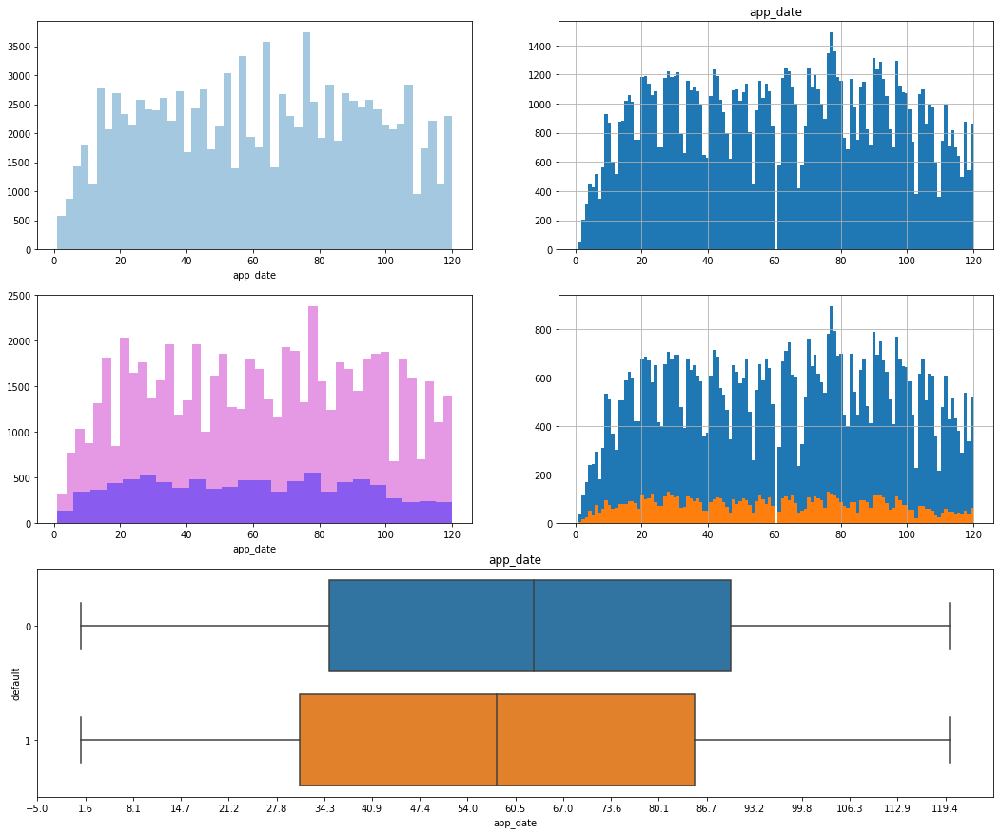

In [116]:
draw_all_plots_for_1feat(train_data_naive, df,
                         'app_date', 'default', bins_cnt=121)

#### Квантили дефолтных чуть смещены, но учитывая размеры временного промежутка в принципе кажется, что очевидные выводы какие-то тут делать нельзя. Более подробно возможно глянем позже

Model type ( 1 of 3 ) = 05_all_cat_log_date_imbalanced_robust
Test
acc = 0.8747 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3942 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8719 bal acc = 0.5125 F1-score = 0.0559 precision = 0.4828 recall = 0.0297
ROC AUC = 0.7334, AUC PR = 0.2878


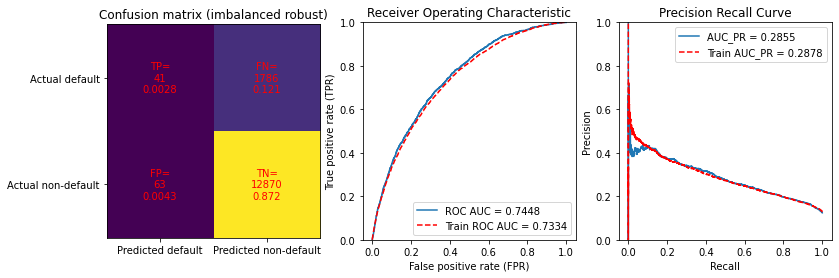

Model type ( 2 of 3 ) = 05_all_cat_log_date_imbalanced_minmax
Test
acc = 0.8749 bal acc = 0.5089 F1-score = 0.0425 precision = 0.4020 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8720 bal acc = 0.5124 F1-score = 0.0553 precision = 0.4868 recall = 0.0293
ROC AUC = 0.7334, AUC PR = 0.2878


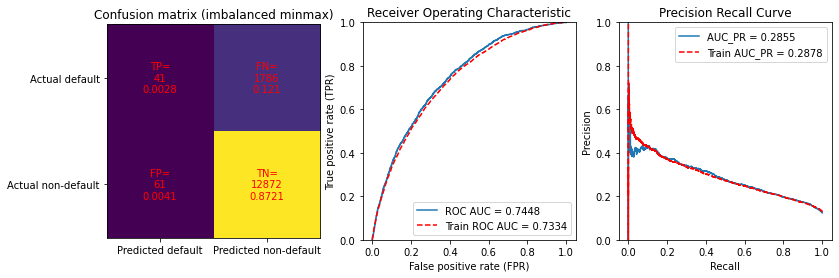

Model type ( 3 of 3 ) = 05_all_cat_log_date_imbalanced_standart
Test
acc = 0.8747 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3942 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8719 bal acc = 0.5125 F1-score = 0.0559 precision = 0.4828 recall = 0.0297
ROC AUC = 0.7334, AUC PR = 0.2878


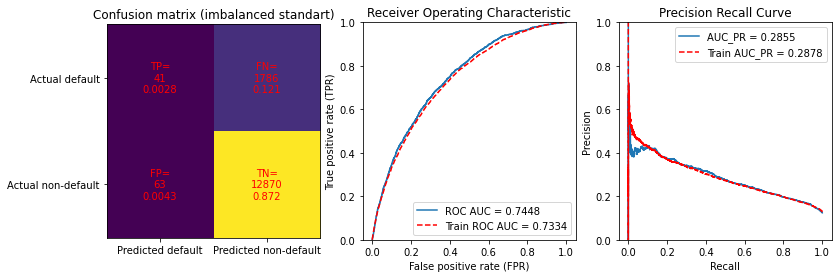

In [117]:
models05 = test_model_variants_params(train_data_naive, num_cols+date_cols, cat_cols +
                                      cat_num_cols, bin_cols, "05_all_cat_log_date", scalers_global, balanced_types_global)
models_dict.update(models05)
save_all_models_submission(
    test_data_naive, num_cols+date_cols, cat_cols+cat_num_cols, bin_cols, models05)

#### При ближайшем рассмотрении кажется, что явно есть пики выходных на датах. Попробуем сделать признак из этого. Напомним календарь:

![Calendar2014quarter1](http://um-ogorod.ru/images/ovsem026.jpg)
![](http://um-ogorod.ru/images/ovsem027.jpg)

In [118]:
def app_date_to_holiday(x):
    after_jan_holi = datetime.strptime('1/8/2014', "%m/%d/%Y").date()
    march8 = datetime.strptime('3/10/2014', "%m/%d/%Y").date()

    if (x.date() <= after_jan_holi):
        return 1
    if (x.date() == march8):
        return 1

    if (x.dayofweek // 5 == 1):
        return 1
    return 0

In [119]:
df['app_date_weekend'] = df['dt'].apply(lambda x: app_date_to_holiday(x))

In [120]:
query_reload()

,0,1,target,0 %,1 %
0,49760.0,14667.0,0.0,0.772347,0.227653
1,7137.0,2235.0,1.0,0.761524,0.238476
2,56897.0,16902.0,train,0.516550,0.153448
3,84946.0,25202.0,full,0.771199,0.228801


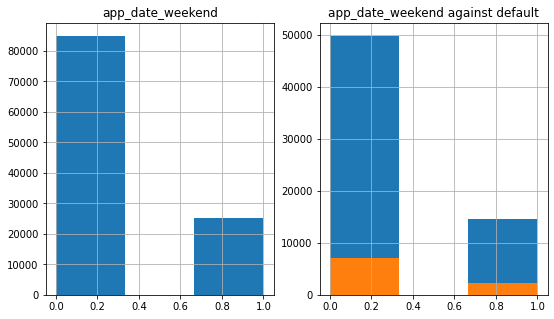

In [121]:
draw_all_plots_for_1_cat_feature(
    train_data_naive, df,  'app_date_weekend', 'default')

#### Доля в дефолтных и не-дефолтных примерно одинаковая

In [122]:
bin_cols_with_date = bin_cols.copy()
bin_cols_with_date.append('app_date_weekend')
bin_cols_with_date, bin_cols

(['sex', 'car', 'car_type', 'foreign_passport', 'app_date_weekend'],
 ['sex', 'car', 'car_type', 'foreign_passport'])

In [123]:
query_reload()

Model type ( 1 of 3 ) = 06_all_cat_log_date_holi_imbalanced_robust
Test
acc = 0.8747 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3942 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8719 bal acc = 0.5125 F1-score = 0.0557 precision = 0.4837 recall = 0.0296
ROC AUC = 0.7334, AUC PR = 0.2879


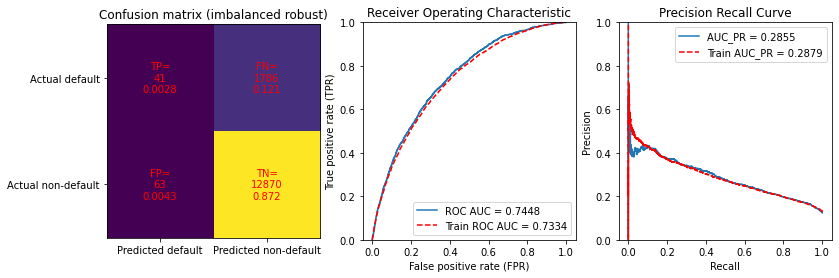

Model type ( 2 of 3 ) = 06_all_cat_log_date_holi_imbalanced_minmax
Test
acc = 0.8749 bal acc = 0.5089 F1-score = 0.0425 precision = 0.4020 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8720 bal acc = 0.5124 F1-score = 0.0553 precision = 0.4868 recall = 0.0293
ROC AUC = 0.7334, AUC PR = 0.2878


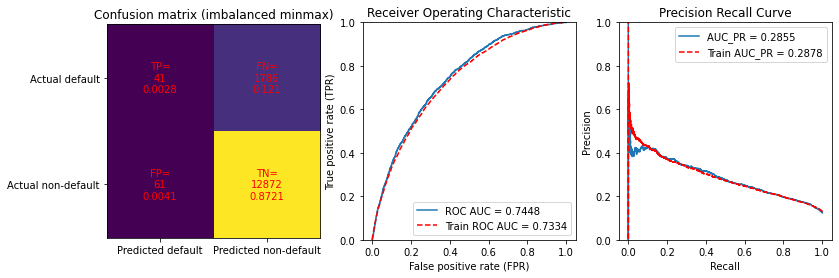

Model type ( 3 of 3 ) = 06_all_cat_log_date_holi_imbalanced_standart
Test
acc = 0.8747 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3942 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8719 bal acc = 0.5125 F1-score = 0.0559 precision = 0.4817 recall = 0.0297
ROC AUC = 0.7334, AUC PR = 0.2878


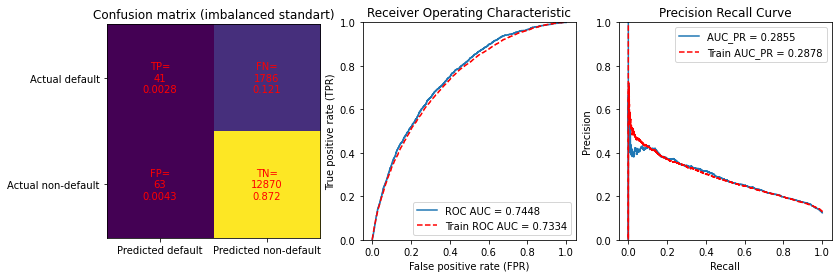

In [124]:
models06 = test_model_variants_params(train_data_naive, num_cols+date_cols, cat_cols +
                                      cat_num_cols, bin_cols_with_date, "06_all_cat_log_date_holi", scalers_global, balanced_types_global)
models_dict.update(models06)
save_all_models_submission(
    test_data_naive, num_cols+date_cols, cat_cols+cat_num_cols, bin_cols_with_date, models06)

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
01_all_cat_imbalanced_minmax,0.871949,0.509752,0.044248,0.479452,0.023194,0.739689,0.280552
01_all_cat_imbalanced_robust,0.871932,0.510704,0.048332,0.480000,0.025447,0.739863,0.280631
01_all_cat_imbalanced_standart,0.871915,0.510694,0.048326,0.478803,0.025447,0.739869,0.280633
03_all_cat_log_imbalanced_minmax,0.871966,0.511119,0.050019,0.483010,0.026375,0.742057,0.283947
03_all_cat_log_imbalanced_robust,0.871983,0.511412,0.051218,0.484561,0.027038,0.742053,0.283975
03_all_cat_log_imbalanced_standart,0.871983,0.511412,0.051218,0.484561,0.027038,0.742054,0.283978
05_all_cat_log_date_imbalanced_minmax,0.872000,0.512383,0.055257,0.486784,0.029291,0.744781,0.285498
05_all_cat_log_date_imbalanced_robust,0.871932,0.512514,0.055937,0.482759,0.029689,0.744781,0.285491
05_all_cat_log_date_imbalanced_standart,0.871932,0.512514,0.055937,0.482759,0.029689,0.744776,0.285492


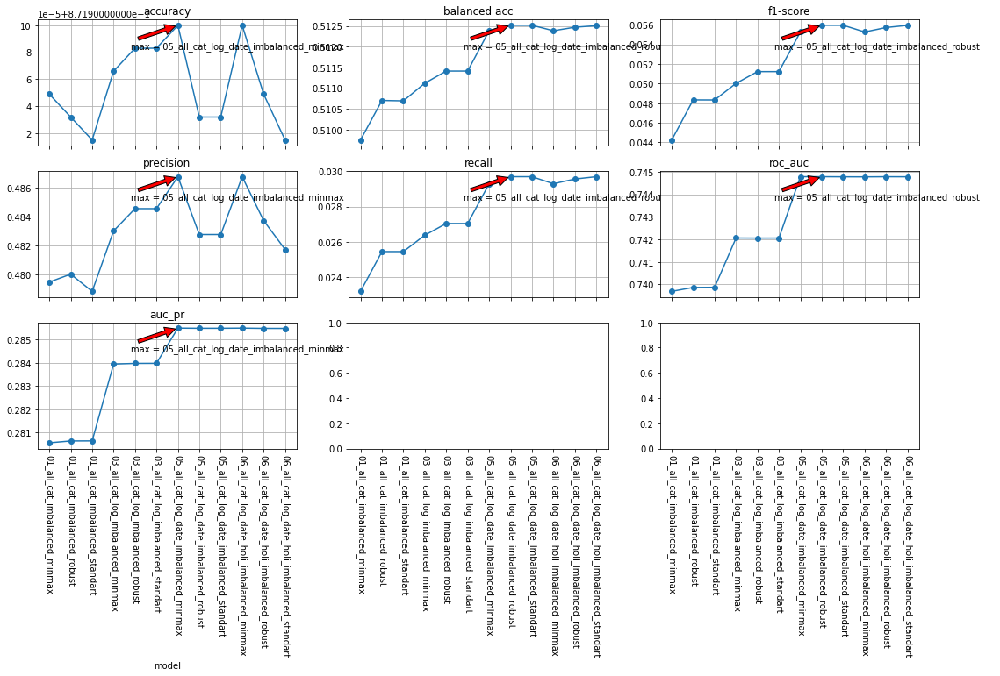

In [125]:
visualize_models(models_dict, should_return_df_=True)

#### Выходные дни не помогли((

### В целом можно сказать, что: <br> 1)  ROC_AUC c увеличением обработки датасета пока медленно и стабильно растет.<br> 2) Также, хотя и медленно, растут balanced accuracy, recal и  f1-score <br> 3) Интересно падение accuracy и precision <br> 4) Кажется, что в будущем можно будет установить каждой колонке-признаку свой тип scaler'a

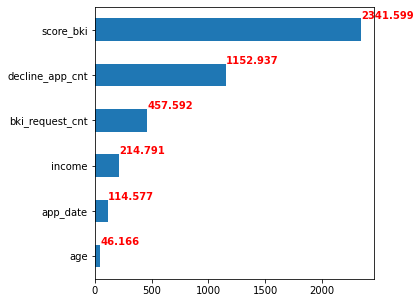

In [126]:
# ещё раз посмотрим на важность признаков
# смотрим тут так как f_classif
f_classif_by_cols(train_data_naive, num_cols+date_cols)

##### Добавилась дата, остальное также

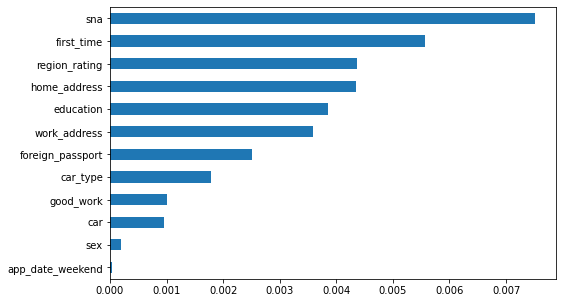

In [127]:
# потом категориальные
mutual_info_classif_by_cols(
    train_data_naive, cat_cols + cat_num_cols + bin_cols_with_date)

#### Немного посмотрим на корелляцию цифровых признаков

<AxesSubplot:>

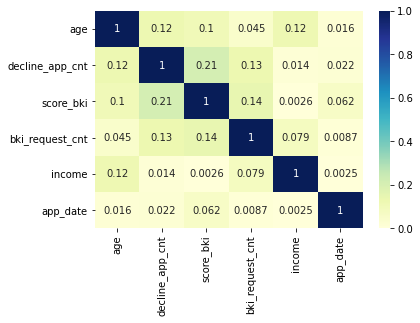

In [128]:
numdate_cols_corr = df[num_cols+date_cols].corr()
plt.figure(figsize=(6, 4))
sns.heatmap(numdate_cols_corr.abs(), annot=True, vmin=0, vmax=1, cmap="YlGnBu")

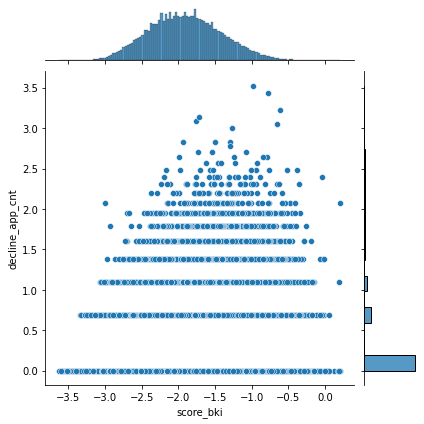

In [129]:
# максимум 0.21. Мало, но нарисуем на всякий случай.
sns.jointplot(x='score_bki', y='decline_app_cnt', data=df)
#sns.jointplot(x='score_bki', y='decline_app_cnt', data=df[df.decline_app_cnt>1.5])

#### Кажется, что ничего экстраординарного или криминального нет и, соответственно, коррелирующих признаков нет. 

### <a id='cat_feat_V'> V. Исследование. Часть 3. Категориальные и бинарные признаки </a> 
([К оглавлению](#table_of_contents))

#### <a id='cat_correleation'> Корелляции </a>

In [130]:
print_column_by_types()

Numerical: ['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'] 
Categorial (string): ['education'] 
Categorial (numbers): ['good_work', 'region_rating', 'home_address', 'work_address', 'sna', 'first_time'] 
Date: ['app_date'] 
Binary (string): ['sex', 'car', 'car_type', 'foreign_passport']


#### Посмотрим на корреляции для начала

<AxesSubplot:>

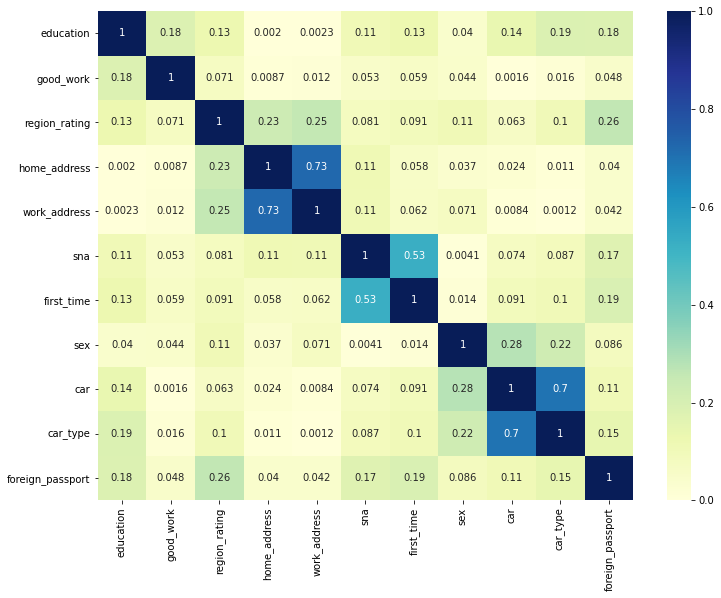

In [131]:
blind_corr = df[cat_cols+cat_num_cols+bin_cols].corr()
plt.figure(figsize=(12, 9))
sns.heatmap(blind_corr.abs(), annot=True, vmin=0, vmax=1, cmap="YlGnBu")

#### Видим три больших корреляции (car/car_type, sna/first_time, home_address/work_address). Изучим по очереди

#### <a id='car_pca'> Car и car_type </a>

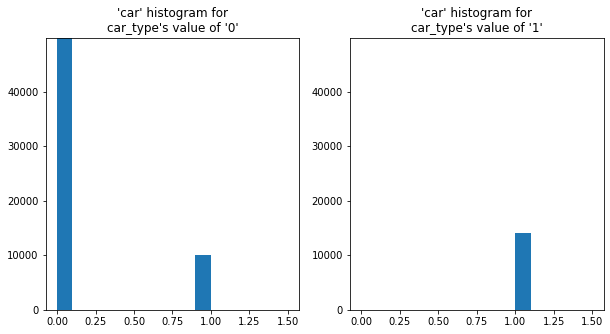

In [132]:
by_group_hists(train_data_naive, 'car', 'car_type')

#### Видим, что все у кого есть иностранная машина имеют машины, что логично. Признаки очевидно связаны. Уберем их и добавим один общий вида [0,1,2] т.е. [нет машины, есть отечественная, есть зарубежная]

In [133]:
def car_transformer(row):
    # print(row)
    if (row['car_type'] == 1):  # 1 1
        return 2
    if (row['car'] == 1):      # 0 1
        return 1
    return 0                 # 0 0

In [134]:
df['car_full'] = df.apply(lambda row: car_transformer(row), axis=1)

In [135]:
df[['car_type', 'car', 'car_full']].head(2)

,car_type,car,car_full
0,1,1,2
1,0,0,0


In [136]:
print_column_by_types()

Numerical: ['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'] 
Categorial (string): ['education'] 
Categorial (numbers): ['good_work', 'region_rating', 'home_address', 'work_address', 'sna', 'first_time'] 
Date: ['app_date'] 
Binary (string): ['sex', 'car', 'car_type', 'foreign_passport']


In [137]:
# сделаем копии переменных колонок признаков
num_cols2 = num_cols.copy()
cat_cols2 = cat_cols.copy()
cat_num_cols2 = cat_num_cols.copy()
bin_cols2 = bin_cols.copy()
date_cols2 = date_cols

In [138]:
cat_cols2.append('car_full')
bin_cols2.remove('car')
bin_cols2.remove('car_type')

In [139]:
num_cols2, cat_cols2, cat_num_cols2, bin_cols2, date_cols2

(['age', 'decline_app_cnt', 'score_bki', 'bki_request_cnt', 'income'],
 ['education', 'car_full'],
 ['good_work',
  'region_rating',
  'home_address',
  'work_address',
  'sna',
  'first_time'],
 ['sex', 'foreign_passport'],
 ['app_date'])

In [140]:
query_reload()

Model type ( 1 of 3 ) = 08_all_cat_log_date_car_imbalanced_robust
Test
acc = 0.8747 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3942 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8719 bal acc = 0.5125 F1-score = 0.0559 precision = 0.4828 recall = 0.0297
ROC AUC = 0.7334, AUC PR = 0.2878


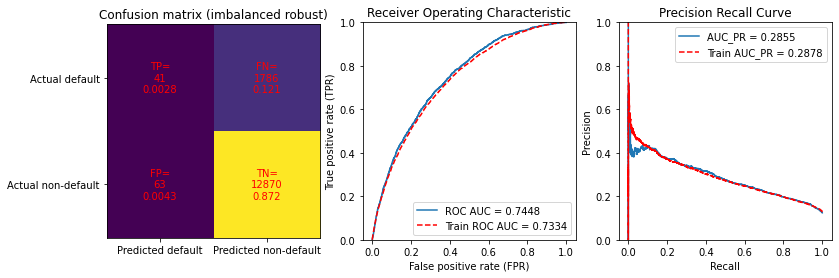

Model type ( 2 of 3 ) = 08_all_cat_log_date_car_imbalanced_minmax
Test
acc = 0.8749 bal acc = 0.5089 F1-score = 0.0425 precision = 0.4020 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8720 bal acc = 0.5124 F1-score = 0.0553 precision = 0.4868 recall = 0.0293
ROC AUC = 0.7334, AUC PR = 0.2878


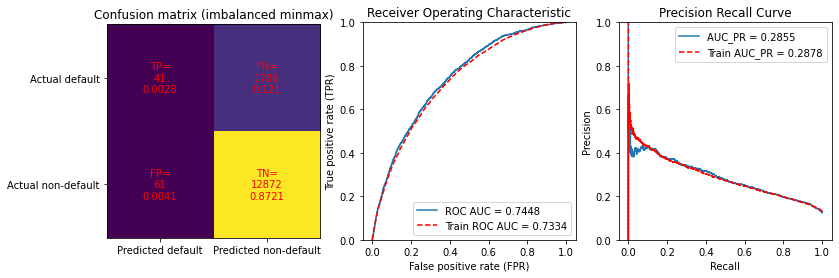

Model type ( 3 of 3 ) = 08_all_cat_log_date_car_imbalanced_standart
Test
acc = 0.8747 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3942 recall = 0.0224
ROC AUC = 0.7448, AUC PR = 0.2855
Train
acc = 0.8719 bal acc = 0.5125 F1-score = 0.0559 precision = 0.4817 recall = 0.0297
ROC AUC = 0.7334, AUC PR = 0.2878


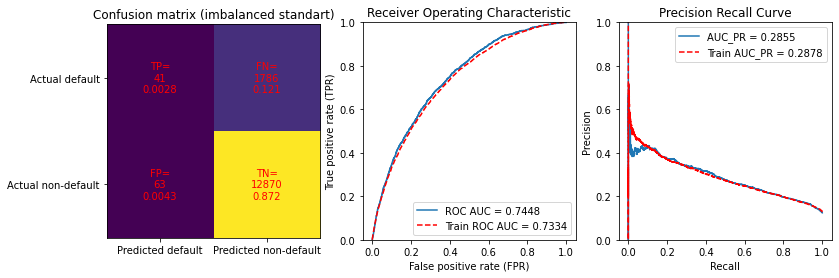

In [141]:
models08 = test_model_variants_params(train_data_naive, num_cols2+date_cols2, cat_cols2 +
                                      cat_num_cols2, bin_cols2, "08_all_cat_log_date_car", scalers_global, balanced_types_global)
models_dict.update(models08)
save_all_models_submission(test_data_naive, num_cols2 +
                           date_cols2, cat_cols2+cat_num_cols2, bin_cols2, models08)

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
01_all_cat_imbalanced_minmax,0.871949,0.509752,0.044248,0.479452,0.023194,0.739689,0.280552
01_all_cat_imbalanced_robust,0.871932,0.510704,0.048332,0.480000,0.025447,0.739863,0.280631
01_all_cat_imbalanced_standart,0.871915,0.510694,0.048326,0.478803,0.025447,0.739869,0.280633
03_all_cat_log_imbalanced_minmax,0.871966,0.511119,0.050019,0.483010,0.026375,0.742057,0.283947
03_all_cat_log_imbalanced_robust,0.871983,0.511412,0.051218,0.484561,0.027038,0.742053,0.283975
03_all_cat_log_imbalanced_standart,0.871983,0.511412,0.051218,0.484561,0.027038,0.742054,0.283978
05_all_cat_log_date_imbalanced_minmax,0.872000,0.512383,0.055257,0.486784,0.029291,0.744781,0.285498
05_all_cat_log_date_imbalanced_robust,0.871932,0.512514,0.055937,0.482759,0.029689,0.744781,0.285491
05_all_cat_log_date_imbalanced_standart,0.871932,0.512514,0.055937,0.482759,0.029689,0.744776,0.285492


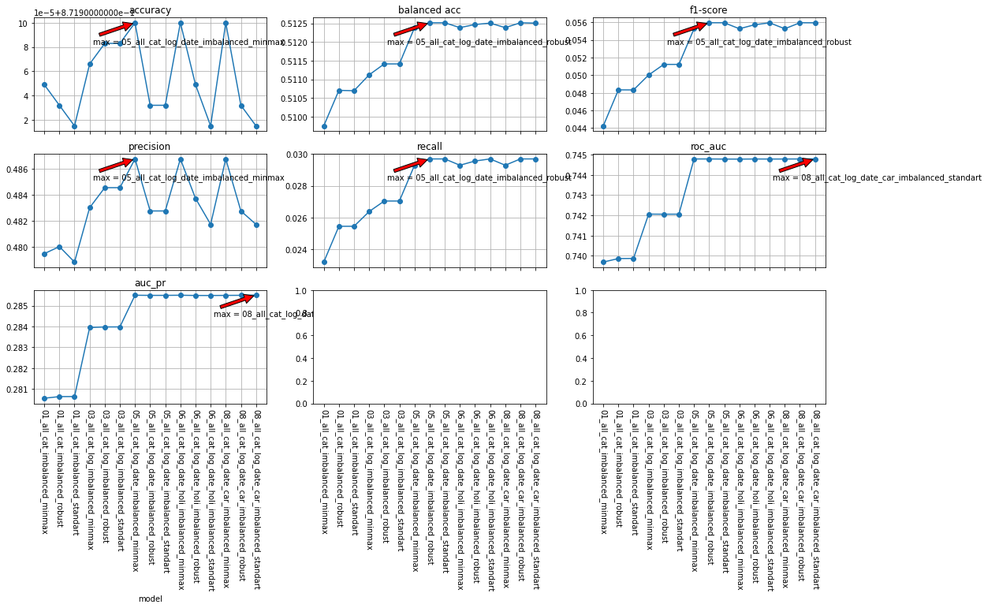

In [142]:
visualize_models(models_dict, should_return_df_=True)

#### Тысячные, но лучше. Посмотрим на следующее.

#### <a id='addr_pca'>Home_address и work_address</a>

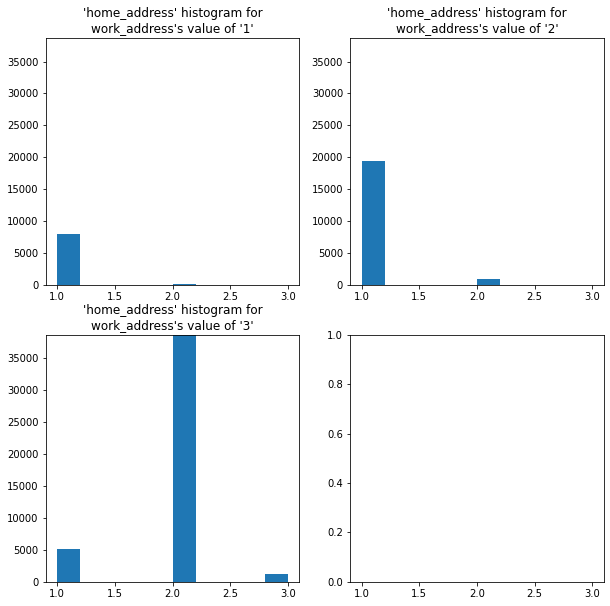

In [143]:
# посмотрим на гистограмму home_address для разных значений work_address
by_group_hists(train_data_naive, 'home_address', 'work_address')

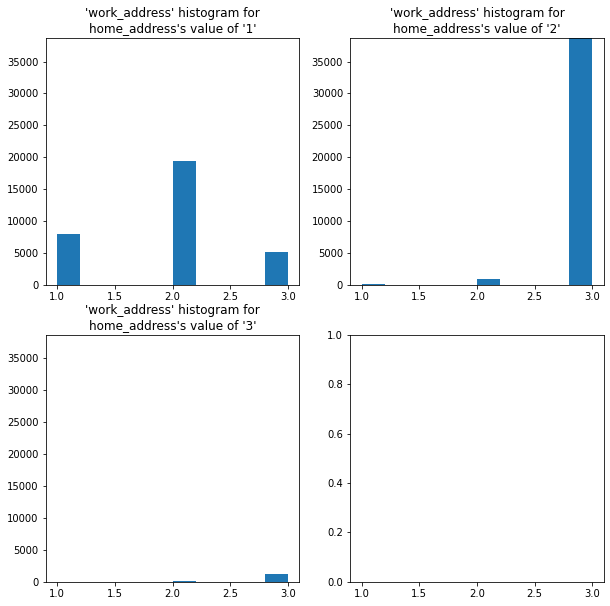

In [144]:
# и наоборот
by_group_hists(train_data_naive, 'work_address', 'home_address')

#### Явно видна связь, но красиво обернуть смыслом/формулой не получается. Попробуем уменьшить просто через PCA. Он вообще для численных, но для категориальных также можно применять - неясно только повезет ли.

In [145]:
df_copy_before_pca1 = df.copy()

In [146]:
data = df[['work_address', 'home_address']].values
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)
pca = PCA(n_components=1)
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)
df['pca_address'] = pca_data

In [147]:
cat_num_cols2.append('pca_address')
cat_num_cols2.remove('home_address')
cat_num_cols2.remove('work_address')

In [148]:
query_reload()

Model type ( 1 of 3 ) = 09_all_cat_log_date_car_addr_imbalanced_robust
Test
acc = 0.8748 bal acc = 0.5091 F1-score = 0.0435 precision = 0.4000 recall = 0.0230
ROC AUC = 0.7458, AUC PR = 0.2871
Train
acc = 0.8719 bal acc = 0.5128 F1-score = 0.0571 precision = 0.4841 recall = 0.0304
ROC AUC = 0.7341, AUC PR = 0.2884


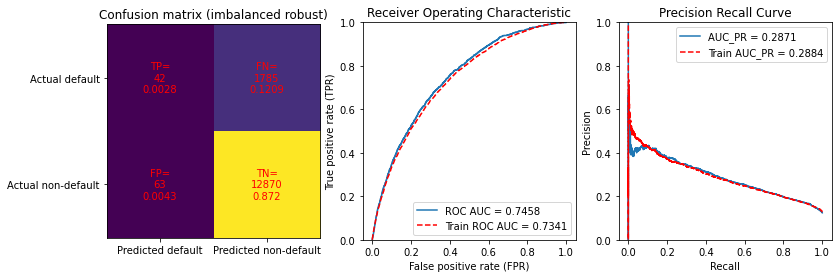

Model type ( 2 of 3 ) = 09_all_cat_log_date_car_addr_imbalanced_minmax
Test
acc = 0.8748 bal acc = 0.5088 F1-score = 0.0425 precision = 0.3981 recall = 0.0224
ROC AUC = 0.7458, AUC PR = 0.2871
Train
acc = 0.8719 bal acc = 0.5123 F1-score = 0.0552 precision = 0.4825 recall = 0.0293
ROC AUC = 0.7341, AUC PR = 0.2884


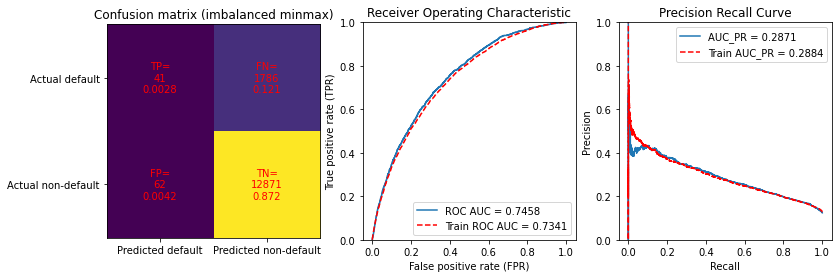

Model type ( 3 of 3 ) = 09_all_cat_log_date_car_addr_imbalanced_standart
Test
acc = 0.8748 bal acc = 0.5091 F1-score = 0.0435 precision = 0.4000 recall = 0.0230
ROC AUC = 0.7458, AUC PR = 0.2871
Train
acc = 0.8719 bal acc = 0.5128 F1-score = 0.0571 precision = 0.4841 recall = 0.0304
ROC AUC = 0.7341, AUC PR = 0.2884


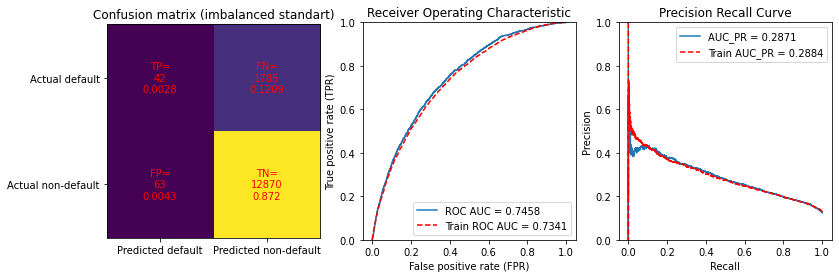

In [149]:
models09 = test_model_variants_params(train_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2,
                                      bin_cols2, "09_all_cat_log_date_car_addr", scalers_global, balanced_types_global)
models_dict.update(models09)
save_all_models_submission(test_data_naive, num_cols2 +
                           date_cols2, cat_cols2+cat_num_cols2, bin_cols2, models09)

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
01_all_cat_imbalanced_minmax,0.871949,0.509752,0.044248,0.479452,0.023194,0.739689,0.280552
01_all_cat_imbalanced_robust,0.871932,0.510704,0.048332,0.480000,0.025447,0.739863,0.280631
01_all_cat_imbalanced_standart,0.871915,0.510694,0.048326,0.478803,0.025447,0.739869,0.280633
03_all_cat_log_imbalanced_minmax,0.871966,0.511119,0.050019,0.483010,0.026375,0.742057,0.283947
03_all_cat_log_imbalanced_robust,0.871983,0.511412,0.051218,0.484561,0.027038,0.742053,0.283975
03_all_cat_log_imbalanced_standart,0.871983,0.511412,0.051218,0.484561,0.027038,0.742054,0.283978
05_all_cat_log_date_imbalanced_minmax,0.872000,0.512383,0.055257,0.486784,0.029291,0.744781,0.285498
05_all_cat_log_date_imbalanced_robust,0.871932,0.512514,0.055937,0.482759,0.029689,0.744781,0.285491
05_all_cat_log_date_imbalanced_standart,0.871932,0.512514,0.055937,0.482759,0.029689,0.744776,0.285492


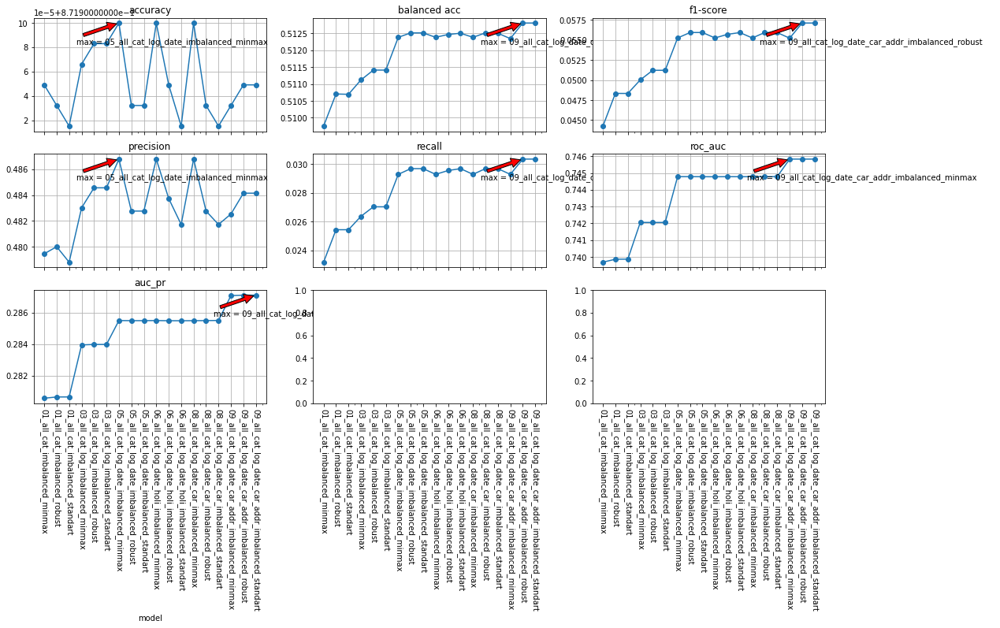

In [150]:
visualize_models(models_dict, should_return_df_=True)

#### Опять же небольшие, но изменения есть. Перейдем к следующим.

#### <a id='sna_ft_pca'>Sna и first_time</a>

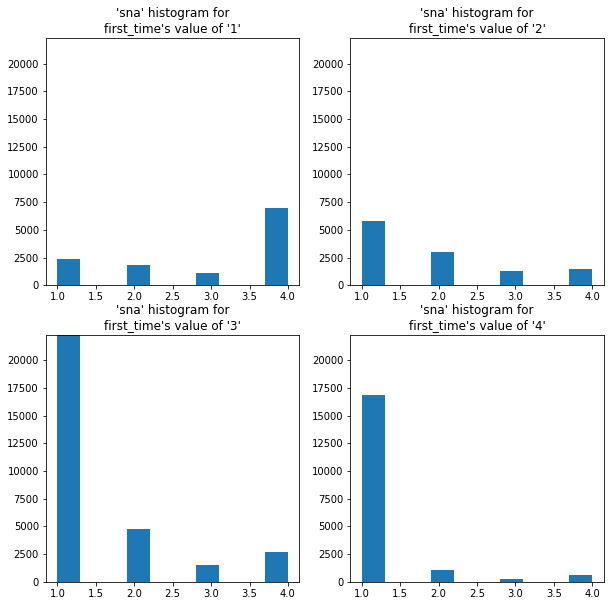

In [151]:
by_group_hists(train_data_naive, 'sna', 'first_time')

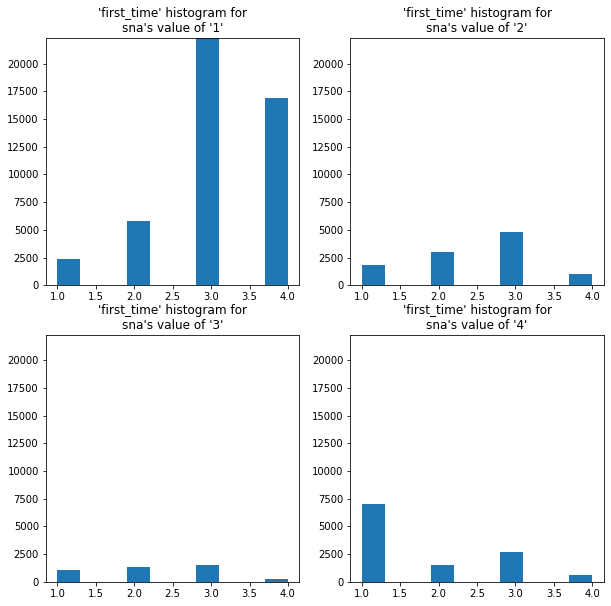

In [152]:
by_group_hists(train_data_naive, 'first_time', 'sna')

#### Ситуация аналогична адресам. Поступим как с адресами. Попробуем уменьшить просто через PCA.

In [153]:
df_copy_before_pca2_sna_ft = df.copy()

In [154]:
data2 = df[['sna', 'first_time']].values
scaler2 = StandardScaler()
scaled_data2 = scaler2.fit_transform(data2)
pca2 = PCA(n_components=1)
pca2.fit(scaled_data2)
pca_data2 = pca2.transform(scaled_data2)
df['pca_sna_ft'] = pca_data2

In [155]:
cat_num_cols2.append('pca_sna_ft')
cat_num_cols2.remove('sna')
cat_num_cols2.remove('first_time')

In [156]:
query_reload()

Model type ( 1 of 3 ) = 10_all_cat_log_date_car_addr_sna_ft_imbalanced_robust
Test
acc = 0.8751 bal acc = 0.5099 F1-score = 0.0465 precision = 0.4206 recall = 0.0246
ROC AUC = 0.7461, AUC PR = 0.2899
Train
acc = 0.8724 bal acc = 0.5143 F1-score = 0.0625 precision = 0.5102 recall = 0.0333
ROC AUC = 0.7355, AUC PR = 0.2913


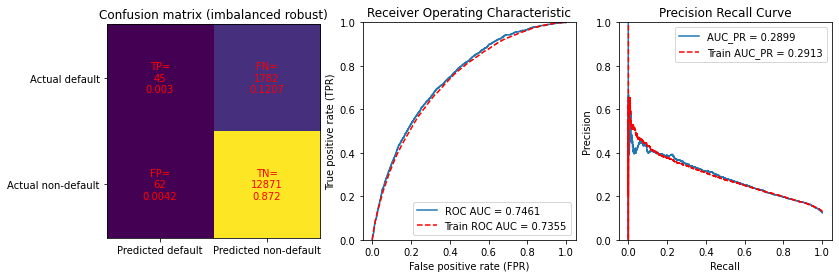

Model type ( 2 of 3 ) = 10_all_cat_log_date_car_addr_sna_ft_imbalanced_minmax
Test
acc = 0.8751 bal acc = 0.5100 F1-score = 0.0466 precision = 0.4245 recall = 0.0246
ROC AUC = 0.7461, AUC PR = 0.2899
Train
acc = 0.8723 bal acc = 0.5140 F1-score = 0.0615 precision = 0.5082 recall = 0.0327
ROC AUC = 0.7355, AUC PR = 0.2913


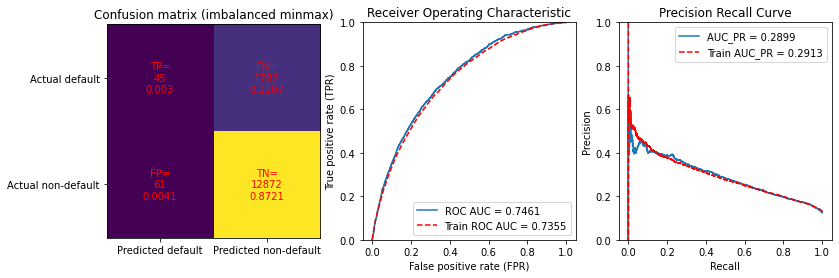

Model type ( 3 of 3 ) = 10_all_cat_log_date_car_addr_sna_ft_imbalanced_standart
Test
acc = 0.8751 bal acc = 0.5099 F1-score = 0.0465 precision = 0.4206 recall = 0.0246
ROC AUC = 0.7461, AUC PR = 0.2899
Train
acc = 0.8724 bal acc = 0.5143 F1-score = 0.0625 precision = 0.5102 recall = 0.0333
ROC AUC = 0.7355, AUC PR = 0.2913


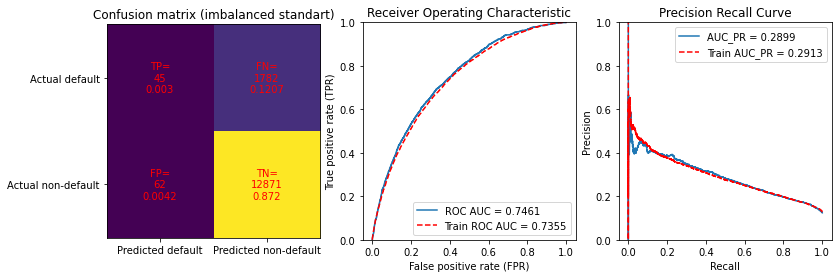

In [157]:
models10 = test_model_variants_params(train_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2,
                                      bin_cols2, "10_all_cat_log_date_car_addr_sna_ft", scalers_global, balanced_types_global)
models_dict.update(models10)
save_all_models_submission(test_data_naive, num_cols2 +
                           date_cols2, cat_cols2+cat_num_cols2, bin_cols2, models10)

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
01_all_cat_imbalanced_minmax,0.871949,0.509752,0.044248,0.479452,0.023194,0.739689,0.280552
01_all_cat_imbalanced_robust,0.871932,0.510704,0.048332,0.480000,0.025447,0.739863,0.280631
01_all_cat_imbalanced_standart,0.871915,0.510694,0.048326,0.478803,0.025447,0.739869,0.280633
03_all_cat_log_imbalanced_minmax,0.871966,0.511119,0.050019,0.483010,0.026375,0.742057,0.283947
03_all_cat_log_imbalanced_robust,0.871983,0.511412,0.051218,0.484561,0.027038,0.742053,0.283975
03_all_cat_log_imbalanced_standart,0.871983,0.511412,0.051218,0.484561,0.027038,0.742054,0.283978
05_all_cat_log_date_imbalanced_minmax,0.872000,0.512383,0.055257,0.486784,0.029291,0.744781,0.285498
05_all_cat_log_date_imbalanced_robust,0.871932,0.512514,0.055937,0.482759,0.029689,0.744781,0.285491
05_all_cat_log_date_imbalanced_standart,0.871932,0.512514,0.055937,0.482759,0.029689,0.744776,0.285492


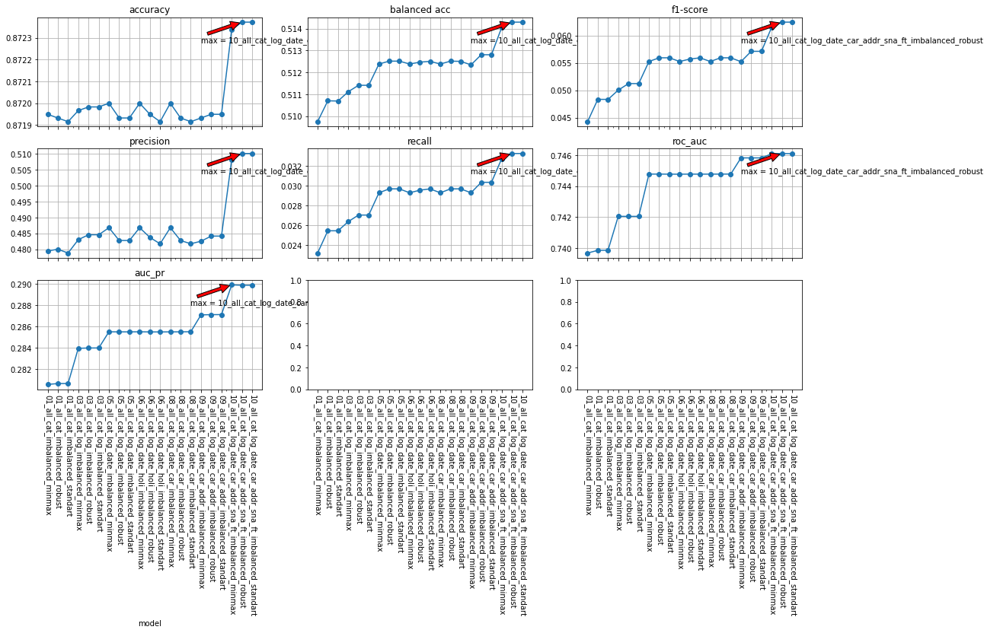

In [158]:
visualize_models(models_dict, should_return_df_=True)

#### Опять же небольшие, но изменения есть.

#### Ещё раз проверим корелляцию

<AxesSubplot:>

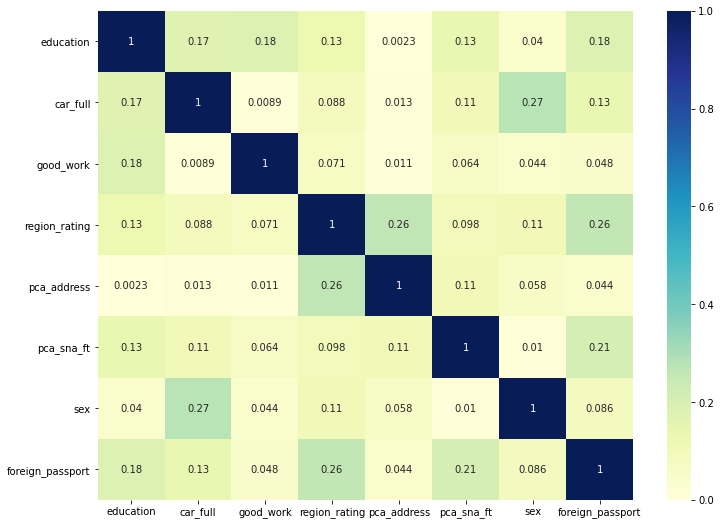

In [159]:
blind_corr2 = df[cat_cols2+cat_num_cols2+bin_cols2].corr()
plt.figure(figsize=(12, 9))
sns.heatmap(blind_corr2.abs(), annot=True, vmin=0, vmax=1, cmap="YlGnBu")

### <a id='hyperparams'> VI. Подбор гиперпараметров </a>
([К оглавлению](#table_of_contents))

In [160]:
# Коэффициент C для сетки параметров
C = list(np.linspace(0.001, 10, 10))   + (list(np.logspace(0, 4, 5)))
C.sort()
C_list = list(dict.fromkeys(C))
print('C_list:', C_list)

C_list: [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]


In [161]:
# настройки сетки параметров
param_grid_X = [
    {'penalty': ['elasticnet'],
     'solver': ['saga'],
     'class_weight':[None, 'balanced'],
     'l1_ratio ': [0.5], #np.linspace(0.001, 0.99, num=5), 
     'multi_class': ['auto', 'ovr']},

    {'penalty': ['l1'],
     'solver': ['liblinear', 'saga'],
     'class_weight':[None, 'balanced'],
     'multi_class': ['auto', 'ovr']},
    
    {'penalty': ['l2'],
     'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
     'class_weight':[None, 'balanced'],
     'multi_class': ['auto', 'ovr']},

    {'penalty': ['none'],
     'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],
     'class_weight':[None, 'balanced'],
     'multi_class': ['auto', 'ovr']}
]

In [162]:
query_reload()

### Запустим по очереди настройку для разных типов скейлеров

In [164]:
# вызов с индекса 1, т.к. для ElasticNet так не работает. Его сделаем отдельно
grid_search_results = oneCV(train_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2,
                                      bin_cols2, 'robust', param_grid_X[1:4], C_list)

C_list_in = [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]
Step  1 of 3 
Params:  {'penalty': ['l1'], 'solver': ['liblinear', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr']}

Best model estimator:  {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Step  2 of 3 
Params:  {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr']}

Best model estimator:  {'C': 1.1119999999999999, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "



Best model estimator:  {'C': 0.001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'none', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}




In [165]:
# вызовы для других скейлеров
grid_search_results_02st = oneCV(train_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2,
                                      bin_cols2, 'standart', param_grid_X[1:4], C_list)

C_list_in = [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]
Step  1 of 3 
Params:  {'penalty': ['l1'], 'solver': ['liblinear', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr'], 'C': [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]}

Best model estimator:  {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Step  2 of 3 
Params:  {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr'], 'C': [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "



Best model estimator:  {'C': 0.001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'none', 'random_state': 42, 'solver': 'newton-cg', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}




In [166]:
grid_search_results_03minmax = oneCV(train_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2,
                                      bin_cols2, 'minmax', param_grid_X[1:4], C_list)

C_list_in = [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]
Step  1 of 3 
Params:  {'penalty': ['l1'], 'solver': ['liblinear', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr'], 'C': [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]}

Best model estimator:  {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Step  2 of 3 
Params:  {'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr'], 'C': [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)



Best model estimator:  {'C': 1.1119999999999999, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'sag', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


Step  3 of 3 
Params:  {'penalty': ['none'], 'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 'class_weight': [None, 'balanced'], 'multi_class': ['auto', 'ovr'], 'C': [0.001, 1.0, 1.1119999999999999, 2.223, 3.334, 4.445, 5.556, 6.667000000000001, 7.7780000000000005, 8.889, 10.0, 100.0, 1000.0, 10000.0]}


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "



Best model estimator:  {'C': 0.001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'none', 'random_state': 42, 'solver': 'newton-cg', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}




### Теперь попробуем elastic net

In [167]:
# создадим сетку параметров для elastic net
param_grid_EN = {'l1_ratio': np.linspace(0.001, 1, 5), 'C':C_list}

In [168]:
grid_search_results_04EN_CV = elastic_net_CV(train_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2,
                                      bin_cols2, scalers_global, param_grid_EN)

Run  1  from  3
Run  2  from  3
Run  3  from  3


### Теперь посмотрим на результаты моделей гиперпараметры которых подобрали

Grid variant:  1
Params: {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.6723 bal acc = 0.6793 F1-score = 0.3422 precision = 0.2277 recall = 0.6886
ROC AUC = 0.7456, AUC PR = 0.2892
Train
acc = 0.6709 bal acc = 0.6708 F1-score = 0.3425 precision = 0.2300 recall = 0.6708
ROC AUC = 0.7357, AUC PR = 0.2904


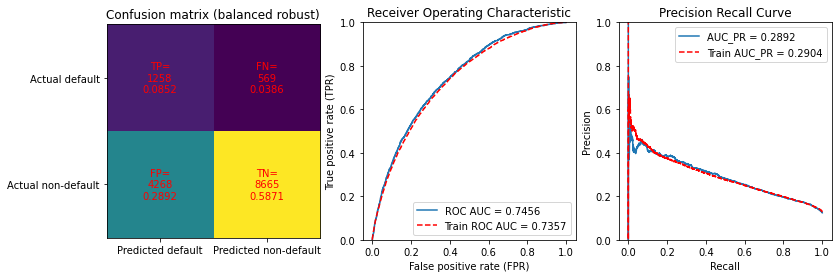

Grid variant:  2
Params: {'C': 1.1119999999999999, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.6724 bal acc = 0.6795 F1-score = 0.3424 precision = 0.2278 recall = 0.6891
ROC AUC = 0.7456, AUC PR = 0.2892
Train
acc = 0.6709 bal acc = 0.6708 F1-score = 0.3424 precision = 0.2299 recall = 0.6705
ROC AUC = 0.7357, AUC PR = 0.2904


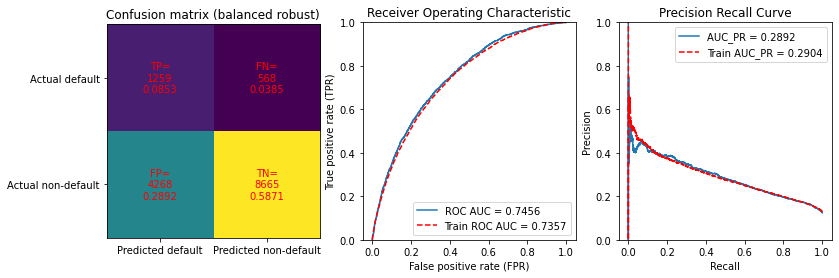

Grid variant:  3
Params: {'C': 0.001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'none', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "


Test
acc = 0.6723 bal acc = 0.6797 F1-score = 0.3425 precision = 0.2278 recall = 0.6897
ROC AUC = 0.7456, AUC PR = 0.2892
Train
acc = 0.6709 bal acc = 0.6708 F1-score = 0.3425 precision = 0.2300 recall = 0.6706
ROC AUC = 0.7357, AUC PR = 0.2904


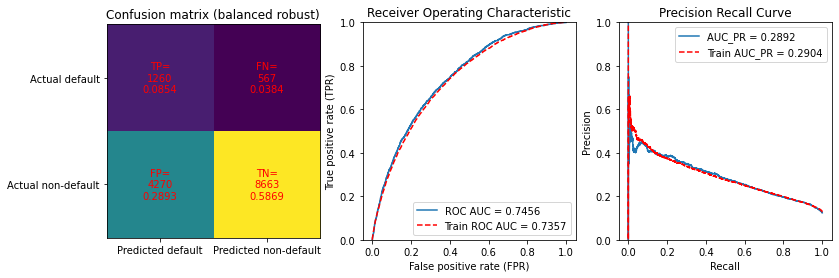

In [170]:
model_dict_cv2 = apply(grid_search_results, 'robust', '10x_Grid_all_cat_log_date_car_addr_sna_ft')

Grid variant:  1
Params: {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.6723 bal acc = 0.6793 F1-score = 0.3422 precision = 0.2277 recall = 0.6886
ROC AUC = 0.7456, AUC PR = 0.2893
Train
acc = 0.6709 bal acc = 0.6708 F1-score = 0.3425 precision = 0.2300 recall = 0.6708
ROC AUC = 0.7357, AUC PR = 0.2904


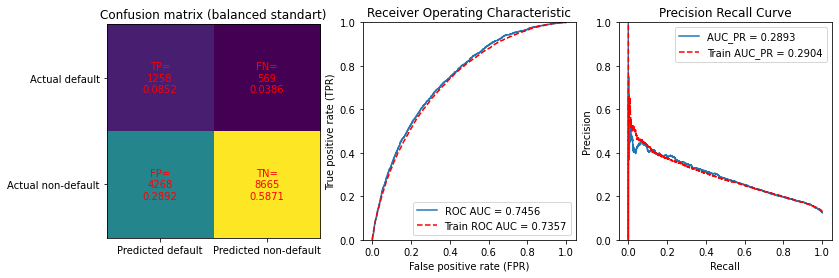

Grid variant:  2
Params: {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.6724 bal acc = 0.6798 F1-score = 0.3426 precision = 0.2279 recall = 0.6897
ROC AUC = 0.7456, AUC PR = 0.2892
Train
acc = 0.6709 bal acc = 0.6708 F1-score = 0.3424 precision = 0.2299 recall = 0.6705
ROC AUC = 0.7357, AUC PR = 0.2904


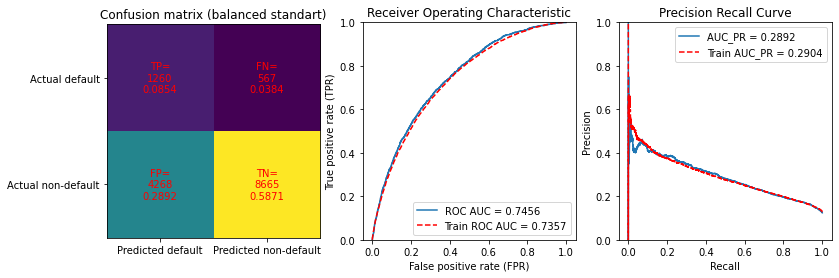

Grid variant:  3
Params: {'C': 0.001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'none', 'random_state': 42, 'solver': 'newton-cg', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "


Test
acc = 0.6724 bal acc = 0.6798 F1-score = 0.3426 precision = 0.2279 recall = 0.6897
ROC AUC = 0.7456, AUC PR = 0.2892
Train
acc = 0.6709 bal acc = 0.6709 F1-score = 0.3425 precision = 0.2300 recall = 0.6708
ROC AUC = 0.7357, AUC PR = 0.2904


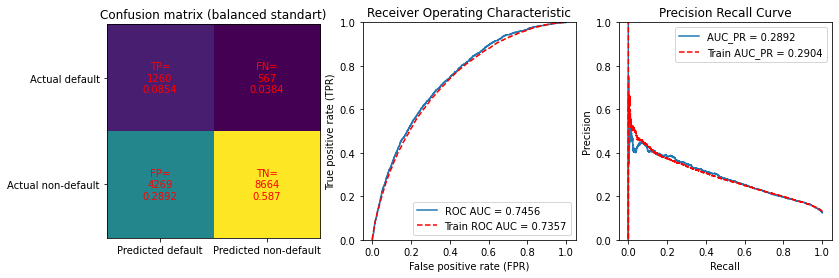

In [171]:
model_dict_cv3st = apply(grid_search_results_02st, 'standart', '10x_Grid_all_cat_log_date_car_addr_sna_ft')

Grid variant:  1
Params: {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.6721 bal acc = 0.6794 F1-score = 0.3422 precision = 0.2276 recall = 0.6891
ROC AUC = 0.7456, AUC PR = 0.2893
Train
acc = 0.6709 bal acc = 0.6710 F1-score = 0.3426 precision = 0.2300 recall = 0.6710
ROC AUC = 0.7357, AUC PR = 0.2904


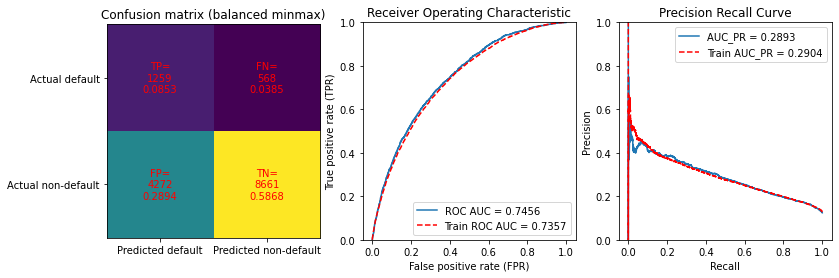

Grid variant:  2
Params: {'C': 1.1119999999999999, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'sag', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


Test
acc = 0.6743 bal acc = 0.6779 F1-score = 0.3416 precision = 0.2278 recall = 0.6825
ROC AUC = 0.7455, AUC PR = 0.2880
Train
acc = 0.6732 bal acc = 0.6704 F1-score = 0.3427 precision = 0.2306 recall = 0.6667
ROC AUC = 0.7351, AUC PR = 0.2901


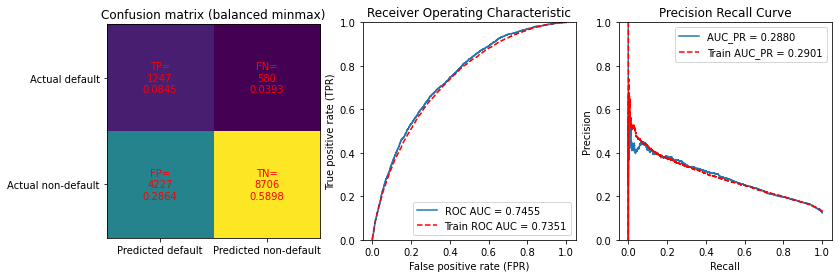

Grid variant:  3
Params: {'C': 0.001, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 300, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'none', 'random_state': 42, 'solver': 'newton-cg', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "


Test
acc = 0.6724 bal acc = 0.6798 F1-score = 0.3426 precision = 0.2279 recall = 0.6897
ROC AUC = 0.7456, AUC PR = 0.2892
Train
acc = 0.6709 bal acc = 0.6709 F1-score = 0.3425 precision = 0.2300 recall = 0.6708
ROC AUC = 0.7357, AUC PR = 0.2904


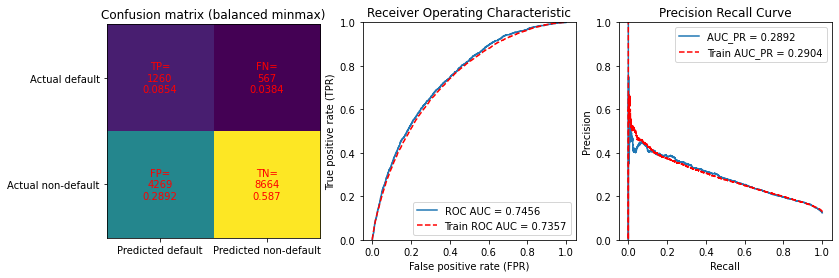

In [172]:
model_dict_cv4mm = apply(grid_search_results_03minmax, 'minmax', '10x_Grid_all_cat_log_date_car_addr_sna_ft')

Grid variant:  1
Params: {'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': 0.25075, 'max_iter': 1000, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'elasticnet', 'random_state': None, 'solver': 'saga', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.8751 bal acc = 0.5099 F1-score = 0.0465 precision = 0.4206 recall = 0.0246
ROC AUC = 0.7461, AUC PR = 0.2900
Train
acc = 0.8724 bal acc = 0.5143 F1-score = 0.0625 precision = 0.5102 recall = 0.0333
ROC AUC = 0.7355, AUC PR = 0.2913


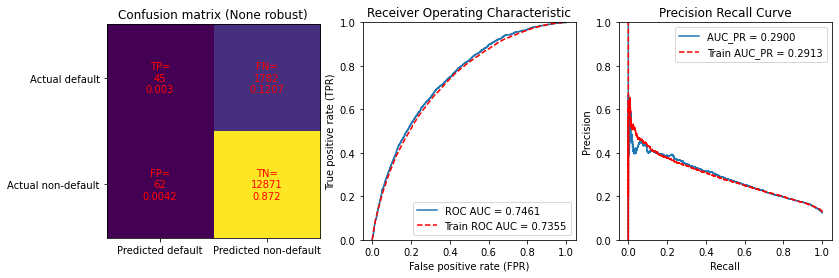

Grid variant:  2
Params: {'C': 5.556, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': 1.0, 'max_iter': 1000, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'elasticnet', 'random_state': None, 'solver': 'saga', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Test
acc = 0.8750 bal acc = 0.5099 F1-score = 0.0465 precision = 0.4167 recall = 0.0246
ROC AUC = 0.7461, AUC PR = 0.2899
Train
acc = 0.8724 bal acc = 0.5143 F1-score = 0.0625 precision = 0.5102 recall = 0.0333
ROC AUC = 0.7356, AUC PR = 0.2913


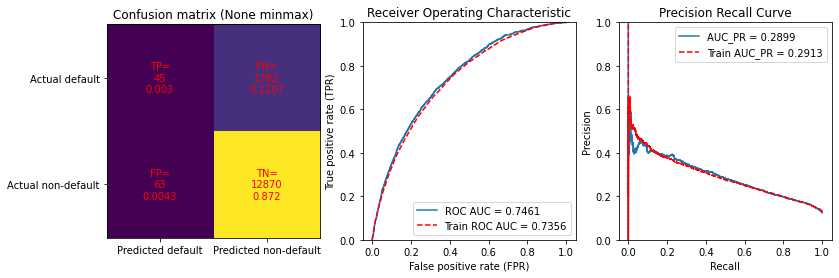

Grid variant:  3
Params: {'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': 0.25075, 'max_iter': 1000, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'elasticnet', 'random_state': None, 'solver': 'saga', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


Test
acc = 0.8751 bal acc = 0.5099 F1-score = 0.0465 precision = 0.4206 recall = 0.0246
ROC AUC = 0.7461, AUC PR = 0.2900
Train
acc = 0.8724 bal acc = 0.5143 F1-score = 0.0625 precision = 0.5091 recall = 0.0333
ROC AUC = 0.7355, AUC PR = 0.2913


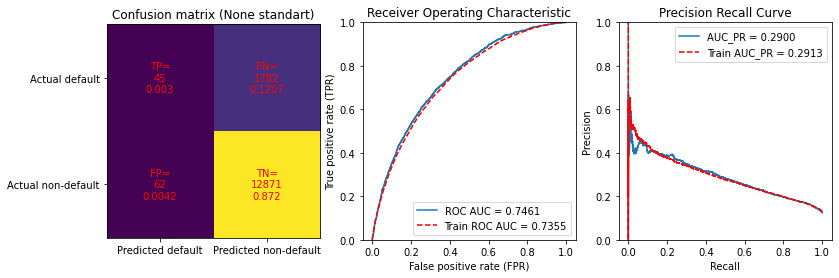

In [173]:
model_dict_cv5en = apply(grid_search_results_04EN_CV, 'xxx', '10x_Grid_all_cat_log_date_car_addr_sna_ft')

In [175]:
models_dict_cv = {}

In [176]:
models_dict_cv.update(model_dict_cv2)

In [177]:
models_dict_cv.update(model_dict_cv3st)
models_dict_cv.update(model_dict_cv4mm)

In [178]:
models_dict_cv.update(model_dict_cv5en)

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
10x_Grid_all_cat_log_date_car_addr_sna_ft_0_minmax_grid,0.670896,0.670957,0.342604,0.230021,0.671040,0.745590,0.289251
10x_Grid_all_cat_log_date_car_addr_sna_ft_0_robust_grid,0.670879,0.670835,0.342503,0.229962,0.670775,0.745590,0.289246
10x_Grid_all_cat_log_date_car_addr_sna_ft_0_standart_grid,0.670862,0.670825,0.342492,0.229951,0.670775,0.745592,0.289254
10x_Grid_all_cat_log_date_car_addr_sna_ft_1_minmax_grid,0.673182,0.670402,0.342701,0.230628,0.666667,0.745513,0.287960
10x_Grid_all_cat_log_date_car_addr_sna_ft_1_robust_grid,0.670929,0.670751,0.342449,0.229944,0.670510,0.745574,0.289222
10x_Grid_all_cat_log_date_car_addr_sna_ft_1_standart_grid,0.670929,0.670751,0.342449,0.229944,0.670510,0.745574,0.289226
10x_Grid_all_cat_log_date_car_addr_sna_ft_2_minmax_grid,0.670946,0.670873,0.342550,0.230004,0.670775,0.745564,0.289190
10x_Grid_all_cat_log_date_car_addr_sna_ft_2_robust_grid,0.670929,0.670807,0.342494,0.229969,0.670643,0.745569,0.289188
10x_Grid_all_cat_log_date_car_addr_sna_ft_2_standart_grid,0.670946,0.670873,0.342550,0.230004,0.670775,0.745564,0.289190


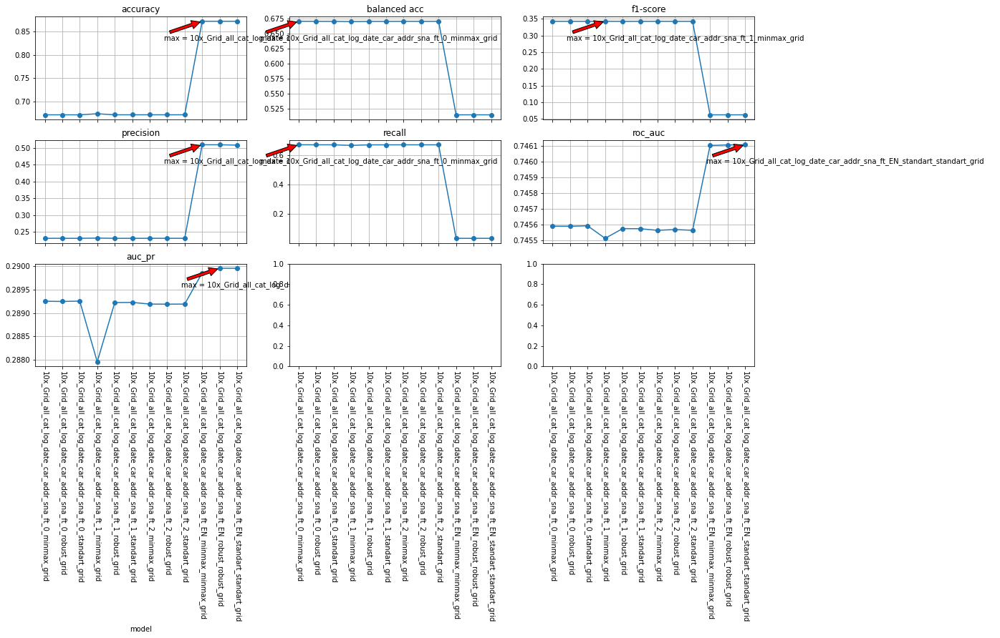

In [180]:
visualize_models(models_dict_cv, set01=False, should_return_df_=True)

In [181]:
save_all_models_submission(test_data_naive, num_cols2+date_cols2, cat_cols2+cat_num_cols2, bin_cols2, models_dict_cv)

### Последние три из них самые лучшие по ROC AUC, для сравнения  для kaggle добавим их в общий словарь моделей.<br> Но, на первых очень хороший recall по сравнению со всеми предыдущими!

In [184]:
for cv_mod in models_dict_cv.keys():
    if (cv_mod.find('EN_') != -1):
        models_dict[cv_mod] = models_dict_cv[cv_mod]   

In [193]:
result_models_df = create_models_df(models_dict, False)

In [209]:
top5_results = result_models_df.sort_values('roc_auc',ascending = False).head(5).sort_values('model').copy()

In [210]:
top5_results

,accuracy,balanced acc,f1-score,precision,recall,roc_auc,auc_pr
model,,,,,,,
10_all_cat_log_date_car_addr_sna_ft_imbalanced_robust,0.872372,0.514293,0.062461,0.510163,0.033267,0.746108,0.289876
10_all_cat_log_date_car_addr_sna_ft_imbalanced_standart,0.872372,0.514293,0.062461,0.510163,0.033267,0.746098,0.289872
10x_Grid_all_cat_log_date_car_addr_sna_ft_EN_minmax_minmax_grid,0.872372,0.514293,0.062461,0.510163,0.033267,0.746103,0.289853
10x_Grid_all_cat_log_date_car_addr_sna_ft_EN_robust_robust_grid,0.872372,0.514293,0.062461,0.510163,0.033267,0.746107,0.289953
10x_Grid_all_cat_log_date_car_addr_sna_ft_EN_standart_standart_grid,0.872356,0.514284,0.062453,0.509128,0.033267,0.746108,0.289953


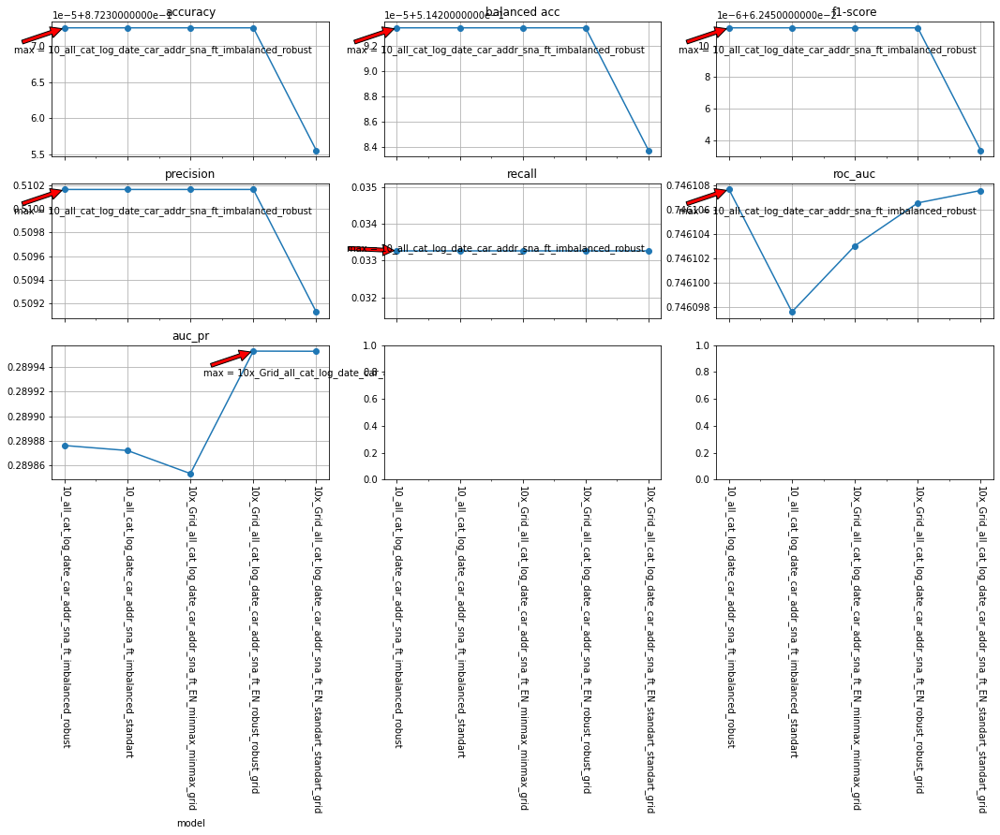

In [211]:
draw_models_metrics_plots(top5_results, False)

### <a id='concs'> Выводы, результаты </a>

#### Мини-обзор

Нули только в одной колонке education.<br>
Присутствуют численные, категориальные (численные и строковые), бинарные (численные и строковые) и дата признаки.<br>
Целевая переменная распределна примерно как 1 к 6.8.

Действия:
* 1) Заполняем нули самым частым значением SCH;
* 2) Бинарные строковые переводим в 0/1;
* 3) Категориальные строковые (education) переводим в числа;
* 4) Первые наивные модели;
* 5) Часть численных логарифмируем (decline_app_cnt, bki_request_count, income). Age и score_bki оставляем;
* 6) Ещё раз строим модели;
* 7) Дату переводим в числа (дает плюс), создаем признак праздника (ничего не дает);
* 8) Смотрим корелляции. Объединяем в один категориальный car+car_type, уменьшаем количество признаков home_address-work_address
и sna-first_time через PCA;
* 9) Подбираем гиперпараметры - варианты penalty, сбалансированности, коэффициента регуляризации

#### Выводы по данным

* 1) Дефолтные клиенты в среднем младше;
* 2) Дефолтные клиенты в среднем имеют гораздо больше отклоненных заявок;
* 3) У дефолтных клиентов score_bki побольше;
* 4) В среднем у дефолтных клиентов количество запросов в БКИ явно больше;
* 5) Доход у не-дефолтных в среднем выше;
* 6) Есть прямая связь между car и car_type, есть корелляция между home_address-work_address и sna-first_time;

Получена модель лучшая на тысячные и меньше по score чем другие, но которая сравнительно хуже по другим метрикам.
Также получены модели наоборот с хорошими метриками но хуже ROC AUC.

### На kaggle отправлены лучшие по score. Но в жизни я вероятно использовал модель с хорошими метриками. Рзница в метриках большая, а в score - минимальная.

В идеале конечно больше исседований.

#### Результат

Лучший score - 0.73875

#### Что ещё надо и хочется сделать

* 0) Ускорить - подбор гиперпараметров слишком уж очень долгий
* 1) Некоторую совместную комбинаторику списка признаков, соотнесения их к типу (бинарыные к категориальным или нет), логарифмирования неотлогарифмированных, поиска по ним всем сетки;
* 2) Больше способов классификации попробовать;
* 3) Попробовать бороться с несбалансированностью;
* 4) Установить тип скейлера поколоночно;
* 5) Возможно подробне глянуть на корелляции около 0.25 - на нескольких парах эксперименты дали совсем унылый результат и рассмотрение отальных я отложил. Вероятно, там как раз надо сделать новые признаки.